https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE128565
## Requirements and Imports

In [1]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import scanpy as sc

import torch
from scipy import sparse
from sklearn.preprocessing import normalize
import models, metrics
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')


print(device)


cuda:0


In [2]:
sns.set_theme()

plt.rcParams.update({'font.size': 18,
                     'xtick.labelsize' : 18,
                     'ytick.labelsize' : 18})

mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['axes.facecolor'] = 'white'


In [3]:
# Read raw data and process it
adata = sc.read('GSE128565_adata_processed.h5ad.h5')
adata

AnnData object with n_obs × n_vars = 32888 × 18210
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'groups', 'treatment', 'groups_named_broad', 'S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man', 'doublet_score', 'groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst', 'groups_named_broad_cond'
    var: 'n_cells', 'highly_variable_genes'
    uns: 'groups_named_beta_dpt_colors', 'groups_named_broad_colors', 'groups_named_fine_colors', 'proliferation_colors', 'proliferation_man_colors', 'rank_genes_groups', 'treatment_colors', 'treatment_colors_rgb'
    obsm: 'X_umap'

In [ ]:
sc.pl.umap(adata,color='groups_named_broad_cond')

In [ ]:
adata_stz = adata[adata.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_GLP1','beta_Ins','beta_InsGLP1','beta_Est','beta_GLP1E',
                                                             'alpha_STZ','alpha_GLP1','alpha_Ins','alpha_InsGLP','alpha_Est','alpha_GLP1E',
                                                             'delta_STZ','delta_GLP1','delta_Ins','delta_InsGLP','delta_Est','delta_GLP1E',])]
sc.pl.umap(adata_stz,color='groups_named_broad_cond')
adata_stz.obs['cond']='stz'
adata_ctrl = adata[adata.obs['groups_named_broad_cond'].isin(['beta_Ctrl','alpha_Ctrl'
                                                                  ,'delta_Ctrl'])]
adata_ctrl.obs['cond']='ctrl'
adata_stz_ctrl = adata_stz.concatenate(adata_ctrl)


In [6]:
sc.pp.filter_genes_dispersion(adata_stz_ctrl,n_top_genes=3000)
sc.pp.filter_genes(adata_stz_ctrl, min_counts=20)
sc.pp.normalize_per_cell(adata_stz_ctrl, counts_per_cell_after=1e4)
sc.pp.log1p(adata_stz_ctrl)


/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/preprocessing/_deprecated/highly_variable_genes.py:115: UserWarning: If you pass `n_top_genes`, all cutoffs are ignored.
  warnings.warn(msg, UserWarning)


In [ ]:
sc.pp.pca(adata_stz_ctrl)
sc.pp.neighbors(adata_stz_ctrl)
sc.tl.umap(adata_stz_ctrl)
sc.pl.umap(adata_stz_ctrl,color=['cond'])
sc.pl.umap(adata_stz_ctrl,color=['groups_named_broad_cond' ])


In [8]:
# epoch_num=30
# prob_list = models.follow_training_dyn_neural_net(adata_stz_ctrl, label_key='cond',iterNum=epoch_num, device='cpu')

In [9]:
# all_conf , all_var = models.probability_list_to_confidence_and_var(prob_list, n_obs= adata_stz_ctrl.n_obs, epoch_num=epoch_num)

In [10]:
#pickle
import pickle
# with open('all_conf_all_var_v4.pkl', 'wb') as f:
#     pickle.dump((all_conf,all_var), f)
#open pikcle
import pickle
with open('all_conf_all_var_v4.pkl', 'rb') as f:
    all_conf,all_var = pickle.load(f)

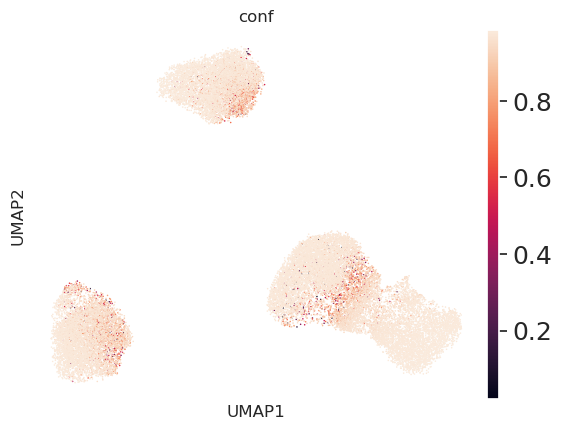

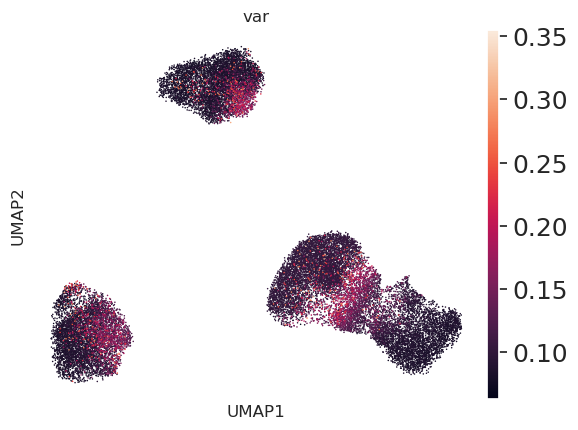

In [11]:
adata_stz_ctrl.obs['conf'] = all_conf.detach().numpy()
adata_stz_ctrl.obs['var'] = all_var.detach().numpy()
sc.pl.umap(adata_stz_ctrl , color='conf')
sc.pl.umap(adata_stz_ctrl , color='var')
#save adata
adata_stz_ctrl.write('adata_stz_ctrl.h5ad')


In [ ]:
#here because the    in  A = scaled_adata.X.toarray() the toarray()  is needed
def rank_genes_conf_min_counts(adata, power=1, power_low=1, min_counts=100):
    """
    Rank genes based on confidence scores and specified parameters.

    Parameters
    ----------
    adata : AnnData
        Anndata object containing the data and annotations.
    power : float, optional
        Power for calculating confidence score for high confidence, by default 1.
    power_low : float, optional
        Power for calculating confidence score for low confidence, by default 1.
    min_counts : int, optional
        Minimum counts for filtering genes, by default 100.

    Returns
    -------
    scaled_adata : AnnData
        Anndata object with additional gene-wise confidence scores.
    """
    scaled_adata = adata.copy()

    # Filter genes based on minimum counts
    sc.pp.filter_genes(scaled_adata, min_counts=min_counts)

    A = scaled_adata.X.toarray()
    print(A)
    mean = np.mean(A, axis=0)
    A = A - mean
    A = normalize(A, axis=0)

    conf_vector = np.array(scaled_adata.obs['conf'])
    low_conf_vector = 1 - conf_vector

    # Normalize confidence vectors
    conf_vector = conf_vector / np.sum(conf_vector)
    low_conf_vector = low_conf_vector / np.sum(low_conf_vector)

    # Create an indicator for ambiguous confidence scores
    ambiguous_indicator = metrics.create_ambiguous_indicator(conf_vector)

    # Calculate confidence scores for high, low, and mid confidence
    scaled_adata.var['conf_score_high'] = A.T @ np.power(conf_vector, power)
    scaled_adata.var['conf_score_low'] = A.T @ np.power(low_conf_vector, power_low)
    scaled_adata.var['conf_score_mid'] = A.T @ ambiguous_indicator

    return scaled_adata
temp_list_r=['beta_STZ','beta_GLP1','beta_Ins','beta_InsGLP1','beta_Est','beta_GLP1E']

adata_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(temp_list_r)]
adata_beta_ranked = rank_genes_conf_min_counts(adata_tmp, 1,1)
sc.pl.umap(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(temp_list_r+["beta_Ctrl"])],color=adata_beta_ranked.var['conf_score_high'].sort_values(ascending=False).index[:10])
sc.pl.umap(adata_tmp,color=['conf'])
sc.pl.umap(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(temp_list_r+["beta_Ctrl"])],color=['groups_named_broad_cond'])

adata_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(temp_list_r+["beta_Ctrl"])]
sc.tl.rank_genes_groups(adata_tmp, 'groups_named_broad_cond' ,method='wilcoxon')
sc.pl.rank_genes_groups(adata_tmp, n_genes=25, sharey=False)


temp_list_r=['beta_STZ','beta_GLP1','beta_Ins','beta_InsGLP1','beta_Est','beta_GLP1E']

adata_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])]
adata_beta_ranked = rank_genes_conf_min_counts(adata_tmp, 1,1)
sc.pl.umap(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(temp_list_r+["beta_Ctrl"])],color=adata_beta_ranked.var['conf_score_high'].sort_values(ascending=False).index[:10])
sc.pl.umap(adata_tmp,color=['conf'])
sc.pl.umap(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(temp_list_r+["beta_Ctrl"])],color=['groups_named_broad_cond'])

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


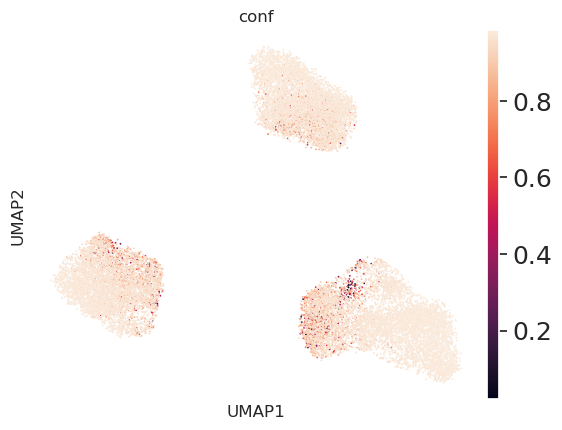

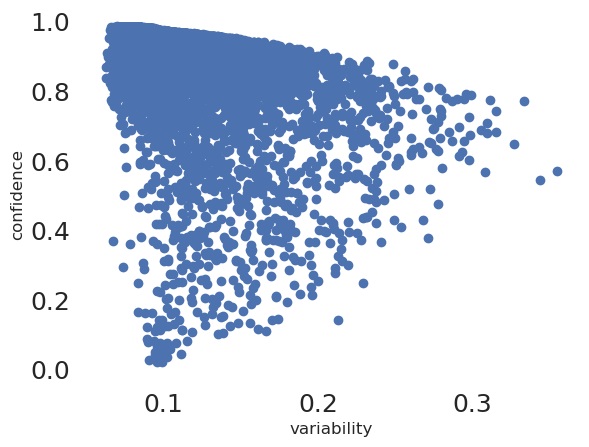

In [13]:
adata_stz = adata_stz_ctrl[adata_stz_ctrl.obs['cond'].isin(['stz'])]
adata_ctrl = adata_stz_ctrl[adata_stz_ctrl.obs['cond'].isin(['ctrl'])]
sc.pp.pca(adata_stz)
sc.pp.neighbors(adata_stz)
sc.tl.umap(adata_stz )
sc.pl.umap(adata_stz , color='conf')
plt.scatter( adata_stz.obs['var'],adata_stz.obs['conf'])#,c=adata.obs['conf_binaries'])
plt.xlabel('variability')
plt.ylabel('confidence')
plt.show()


In [14]:
# adata_beta_stz
adata_beta_ctrl = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_Ctrl'])]
adata_beta_ctrl

View of AnnData object with n_obs × n_vars = 5664 × 2319
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'groups', 'treatment', 'groups_named_broad', 'S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man', 'doublet_score', 'groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst', 'groups_named_broad_cond', 'cond', 'batch', 'conf', 'var'
    var: 'n_cells', 'highly_variable_genes', 'means', 'dispersions', 'dispersions_norm', 'n_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'cond_colors', 'groups_named_broad_cond_colors'
    obsm: 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [15]:
adata_stz_ctrl.obs['groups_named_broad_cond']


index
AAACCTGAGAGTACCG-1_G2-0      beta_STZ
AAACCTGCACATTCGA-1_G2-0      beta_STZ
AAACCTGGTGAGGCTA-1_G2-0     delta_STZ
AAACCTGGTGATAAGT-1_G2-0     delta_STZ
AAACCTGTCATGTCCC-1_G2-0     alpha_STZ
                              ...    
TTTGTCAGTTACGACT-1_G1-1    delta_Ctrl
TTTGTCATCAACACCA-1_G1-1     beta_Ctrl
TTTGTCATCACATACG-1_G1-1     beta_Ctrl
TTTGTCATCCGAAGAG-1_G1-1     beta_Ctrl
TTTGTCATCTGTCTAT-1_G1-1     beta_Ctrl
Name: groups_named_broad_cond, Length: 24576, dtype: category
Categories (21, object): ['alpha_Ctrl', 'alpha_Est', 'alpha_GLP1', 'alpha_GLP1E', ..., 'delta_GLP1E', 'delta_Ins', 'delta_InsGLP', 'delta_STZ']

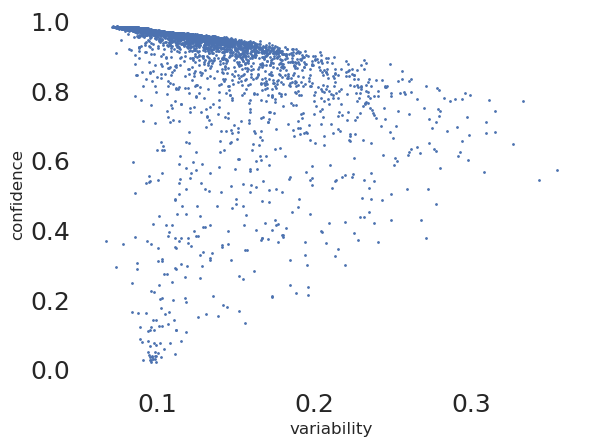

In [16]:
adata_beta_stz = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
plt.scatter( adata_beta_stz.obs['var'],adata_beta_stz.obs['conf'],s=1)#,c=adata_beta_only_stz[:,'Ins2'].X.toarray())
plt.xlabel('variability')
plt.ylabel('confidence')
plt.show()


In [17]:
adata_beta_only_stz = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ'])]
adata_beta_only_ins = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_Ins'])]
adata_beta_only_glp1 = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_GLP1'])]
adata_beta_only_Insglp1 = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_InsGLP1'])]
adata_beta_only_Est = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_Est'])]
adata_beta_only_glp1e = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_GLP1E'])]


In [18]:
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'], 
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                                    }
#'other':['Pdx1','Mafa','Nkx6-1']

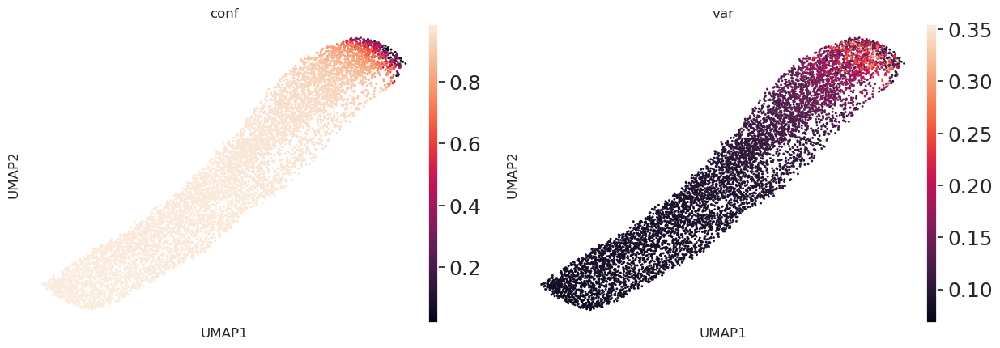

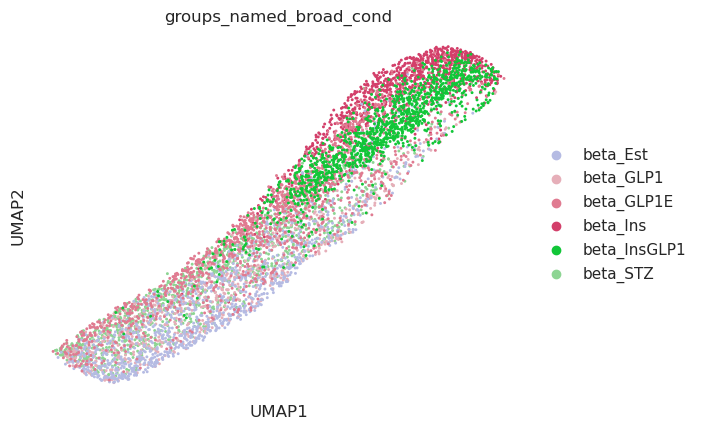

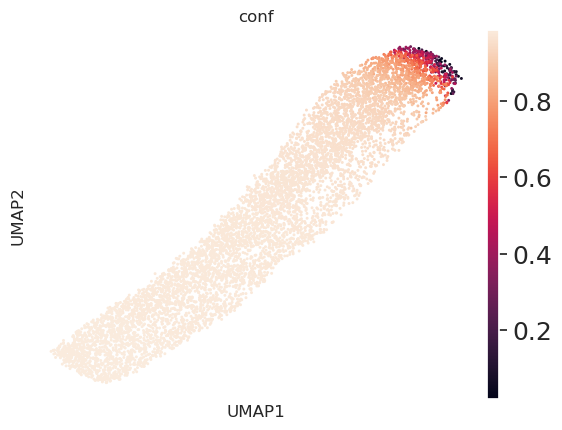

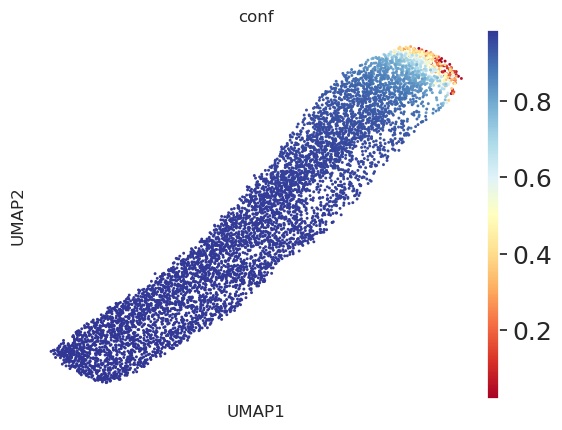

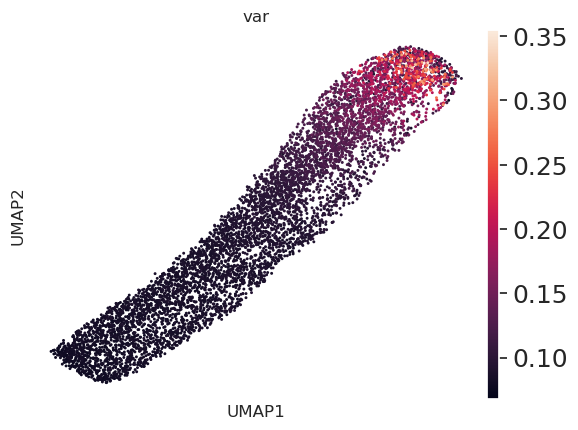

/tmp/ipykernel_3120233/1409488735.py:37: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_beta_stz.obs['var_position'] = positions_var


In [19]:

adata_beta_stz_for_graph = adata_beta_stz.copy()

connectivities_graph , distance_graph  = metrics.make_conf_graph(adata_beta_stz_for_graph.copy(), alpha=0.65 , k=15)

adata_beta_stz_for_graph.obsp['connectivities']=sparse.csr_matrix(connectivities_graph)
sc.tl.umap(adata_beta_stz_for_graph)
sc.pl.umap(adata_beta_stz_for_graph, color=['conf','var'])
sc.pl.umap(adata_beta_stz_for_graph,color=['groups_named_broad_cond'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'],color_map='RdYlBu',save="conf_beta_stz.svg")
sc.pl.umap(adata_beta_stz_for_graph,color=['var'])
# sc.pl.umap(adata_beta_stz_for_graph,color=['annotation'])


sorted_indices_conf = np.argsort(adata_beta_stz_for_graph.obs['conf'])
positions_conf = np.empty_like(sorted_indices_conf)
positions_conf[sorted_indices_conf] = np.arange(len((adata_beta_stz_for_graph.obs['conf'])))
n = len(sorted_indices_conf)

mean_distance_conf = metrics.mean_absolute_distance(n)





sorted_indices_var = np.argsort(adata_beta_stz.obs['var'])
positions_var = np.empty_like(sorted_indices_var)
positions_var[sorted_indices_var] = np.arange(len((adata_beta_stz.obs['var'])))





# adata_beta_stz.obs['var_position'] = positions_var/mean_distance_conf
# adata_beta_stz.obs['conf_position'] = positions_conf/mean_distance_conf

adata_beta_stz.obs['var_position'] = positions_var
adata_beta_stz.obs['conf_position'] = positions_conf


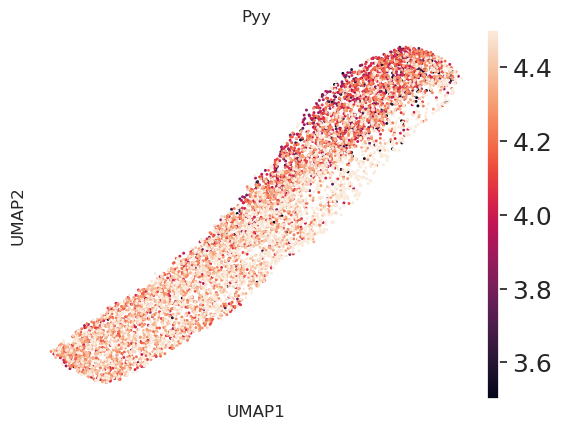

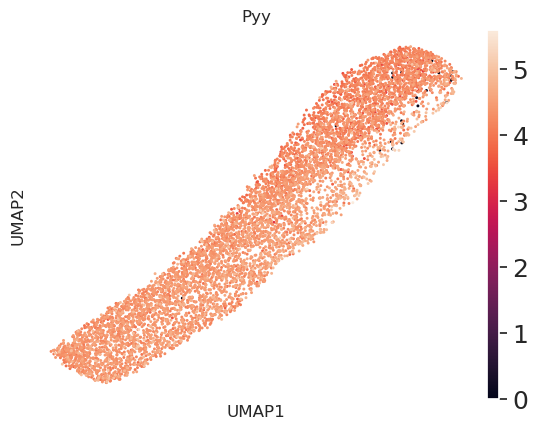

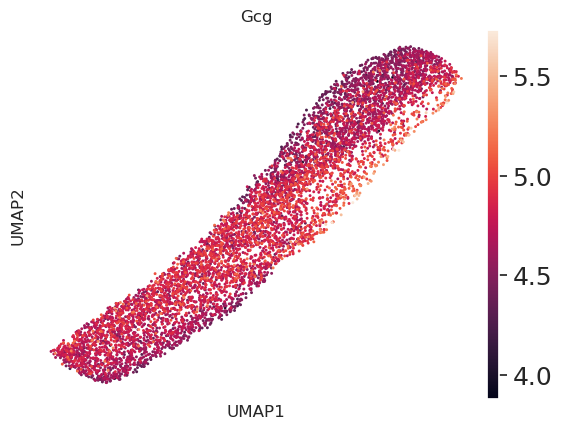

In [20]:
sc.pl.umap(adata_beta_stz_for_graph,color=['Pyy'],vmin=3.5,vmax=4.5)
sc.pl.umap(adata_beta_stz_for_graph,color=['Pyy'])
sc.pl.umap(adata_beta_stz_for_graph,color=['Gcg'])


(7,)
0
1
2
3
4
5
6


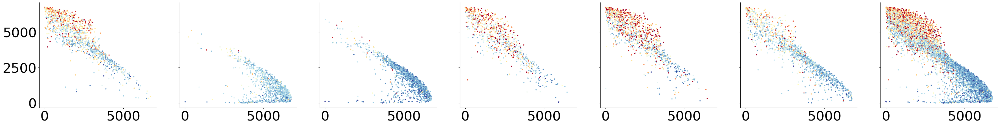

In [21]:
temp_list_r=['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E','all_beta']
adata_beta_stz_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]


plt.rcParams.update(plt.rcParamsDefault)

fig, axes = plt.subplots(nrows=1, ncols=len(temp_list_r), figsize=(45, 5), sharex=True, sharey=True)
print(axes.shape)
for i,cond in enumerate(temp_list_r):
    if cond == 'all_beta':
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin(temp_list_r[0:-1])]
    else:
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin([cond])]


    gene_index = adata_tmp.var_names.get_loc('Ins1')
    gene_expression_values_ins1 = adata_tmp.X[:, gene_index]
    gene_name='Ins1'
    ax = axes[i]
    scatter = ax.scatter(adata_tmp.obs['var_position'], adata_tmp.obs['conf_position'], c=gene_expression_values_ins1.toarray(),s=5,cmap='RdYlBu',vmin=4.5,vmax=6)


    ax.tick_params(axis='both', labelsize=35)


    print(i)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)




plt.savefig(f'figures/a_v3.png',dpi=600)
plt.savefig(f'figures/a_v3.svg',dpi=600,format='svg')
plt.savefig(f'figures/temp.png',dpi=300)
plt.show()

In [22]:
sns.set_theme()
# plt.rcParams.update(plt.rcParamsDefault)

plt.rcParams.update({'font.size': 18,
                     'xtick.labelsize' : 18,
                     'ytick.labelsize' : 18})

mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['axes.facecolor'] = 'white'

In [ ]:
temp_list_r=['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E','all_beta']
adata_beta_stz_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
# adata_beta_stz = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
plt.rcParams.update(plt.rcParamsDefault)


fig, axes = plt.subplots(nrows=1, ncols=len(temp_list_r), figsize=(40, 5), sharex=True, sharey=True)
print(axes.shape)
for i,cond in enumerate(temp_list_r):
    if cond == 'all_beta':
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin(temp_list_r[0:-1])]
    else:
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin([cond])]


    gene_index = adata_tmp.var_names.get_loc('Ins1')
    gene_expression_values_ins1 = adata_tmp.X[:, gene_index]
    gene_name='Ins1'
    ax = axes[i]
    scatter = ax.scatter(adata_tmp.obs['var'], adata_tmp.obs['conf'], c=gene_expression_values_ins1.toarray(),s=5,cmap='RdYlBu',vmin=4.5,vmax=6)


    ax.tick_params(axis='both', labelsize=35)

    ax.set_xlim(0,max(adata_tmp.obs['var']))


    print(i)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.savefig(f'figures/b_v3_sup.png',dpi=600)
plt.savefig(f'figures/b_v3_sup.svg',dpi=600,format='svg')

# plt.savefig(f'figures/a_high_res.png',dpi=100)
plt.show()

sns.set_theme()
# plt.rcParams.update(plt.rcParamsDefault)

plt.rcParams.update({'font.size': 18,
                     'xtick.labelsize' : 18,
                     'ytick.labelsize' : 18})

mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['axes.facecolor'] = 'white'

In [ ]:
temp_list_r=['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E','all_beta']
adata_beta_stz_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
# adata_beta_stz = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]

# mpl.rcParams['figure.facecolor'] = 'white'
# mpl.rcParams['axes.facecolor'] = 'white'
plt.rcParams.update(plt.rcParamsDefault)

fig, axes = plt.subplots(nrows=1, ncols=len(temp_list_r), figsize=(40, 5), sharex=True, sharey=True)
print(axes.shape)
for i,cond in enumerate(temp_list_r):
    if cond == 'all_beta':
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin(temp_list_r[0:-1])]
    else:
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin([cond])]


    gene_index = adata_tmp.var_names.get_loc('Serpina7')
    gene_expression_values_ser = adata_tmp.X[:, gene_index]
    gene_name='Serpina7'
    ax = axes[i]
    scatter = ax.scatter(adata_tmp.obs['var_position'], adata_tmp.obs['conf_position'], c=gene_expression_values_ser.toarray(),s=5,cmap='RdYlBu')
    #
    # if i == 0 :
    #     ax.set_ylabel('confidence rank',fontsize=20)

    # if i == len(temp_list_r)-1:
    #     cbar = plt.colorbar(scatter, ax=ax)
    #     cbar.ax.tick_params(labelsize=20)

    ax.tick_params(axis='both', labelsize=35)

    # ax.set_title(f'{cond}',fontsize=20)


    #change tikers font size
    # for tick in ax.xaxis.get_major_ticks():
    #     tick.label.set_fontsize(20)
    print(i)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.savefig(f'figures/a_v3_sup.png',dpi=600)
plt.savefig(f'figures/a_v3_sup.svg',dpi=600,format='svg')
# plt.savefig(f'figures/a_high_res.png',dpi=100)
plt.show()

sns.set_theme()
# plt.rcParams.update(plt.rcParamsDefault)

plt.rcParams.update({'font.size': 18,
                     'xtick.labelsize' : 18,
                     'ytick.labelsize' : 18})

mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['axes.facecolor'] = 'white'

In [ ]:
temp_list_r=['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E','all_beta']
adata_beta_stz_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
# adata_beta_stz = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
plt.rcParams.update(plt.rcParamsDefault)

fig, axes = plt.subplots(nrows=1, ncols=len(temp_list_r), figsize=(40, 5), sharex=True, sharey=True)
print(axes.shape)
for i,cond in enumerate(temp_list_r):
    if cond == 'all_beta':
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin(temp_list_r[0:-1])]
    else:
        adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin([cond])]


    gene_index = adata_tmp.var_names.get_loc('Serpina7')
    gene_expression_values_ins1 = adata_tmp.X[:, gene_index]
    gene_name='Serpina7'
    ax = axes[i]
    scatter = ax.scatter(adata_tmp.obs['var'], adata_tmp.obs['conf'], c=gene_expression_values_ins1.toarray(),s=5,cmap='RdYlBu')

    # if i == 0 :
    #     ax.set_ylabel('confidence rank',fontsize=20)
    #
    # if i == len(temp_list_r)-1:
    #     cbar = plt.colorbar(scatter, ax=ax)
    #     cbar.ax.tick_params(labelsize=20)

    ax.tick_params(axis='both', labelsize=35)

    # ax.set_title(f'{cond}',fontsize=20)
    ax.set_xlim(0,max(adata_tmp.obs['var']))

    #change tikers font size
    # for tick in ax.xaxis.get_major_ticks():
    #     tick.label.set_fontsize(20)
    print(i)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.savefig(f'figures/c_v3_sup.png',dpi=600)
plt.savefig(f'figures/c_v3_sup.svg',dpi=600,format='svg')
# plt.savefig(f'figures/a_high_res.png',dpi=100)
plt.show()

sns.set_theme()
# plt.rcParams.update(plt.rcParamsDefault)

plt.rcParams.update({'font.size': 18,
                     'xtick.labelsize' : 18,
                     'ytick.labelsize' : 18})

mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['axes.facecolor'] = 'white'

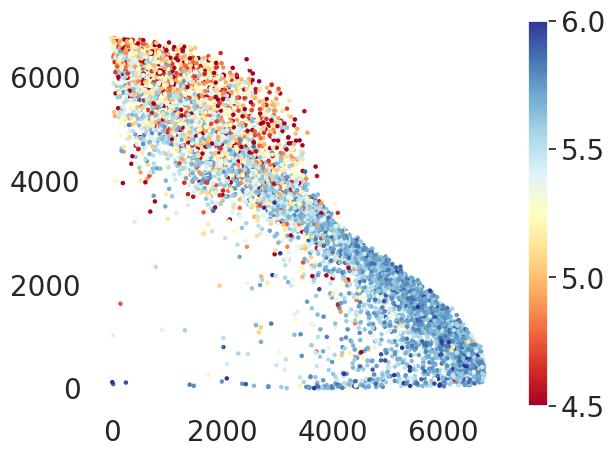

In [36]:
temp_list_r=['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E','all_beta']
adata_beta_stz_tmp = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
# adata_beta_stz = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]


# fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(50, 50))
plt.figure(figsize=(6.6,5))
adata_tmp = adata_beta_stz[adata_beta_stz.obs['groups_named_broad_cond'].isin(temp_list_r[0:-1])]
gene_index = adata_tmp.var_names.get_loc('Ins1')
gene_expression_values_ins1 = adata_tmp.X[:, gene_index]
gene_name='Ins1'
scatter = plt.scatter(adata_tmp.obs['var_position'], adata_tmp.obs['conf_position'], c=gene_expression_values_ins1.toarray(),s=5,cmap='RdYlBu',vmin=4.5,vmax=6)

# plt.ylabel('confidence rank',fontsize=20)
# plt.xlabel('variability rank',fontsize=20)

cbar = plt.colorbar(scatter)
#cbar thiker font size
cbar.ax.tick_params(labelsize=20)
# cbar.set_label(f'Expression of {gene_name}',fontsize=20)
cbar.set_ticks([4.5, 5,5.5, 6])
plt.tick_params(axis='both', labelsize=20)

# plt.savefig(f'figures/a_v2.png',dpi=300)

    # cbar = plt.colorbar(scatter, ax=ax)

plt.savefig(f'figures/fig1_v5.png',dpi=600)
plt.savefig(f'figures/fig1_v5.svg',dpi=600,format='svg')
#show x and y axis in log scale
# plt.xscale('log')
# plt.yscale('log')
plt.show()


/tmp/ipykernel_3484516/1688358221.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_beta_stz_ctrl.obs['conf_binaries'] = pd.Categorical((adata_beta_stz_ctrl.obs['conf'] > 0.15)
/tmp/ipykernel_3484516/1688358221.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
/tmp/ipykernel_3484516/1688358221.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif adata_beta_stz_ctrl.obs['conf_binaries'][i]==True:
/tmp/ipykernel_3484516/1688358221.py:17: FutureWarning: Series.__getitem__ treatin

beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_GLP1E
beta_GLP1E
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1


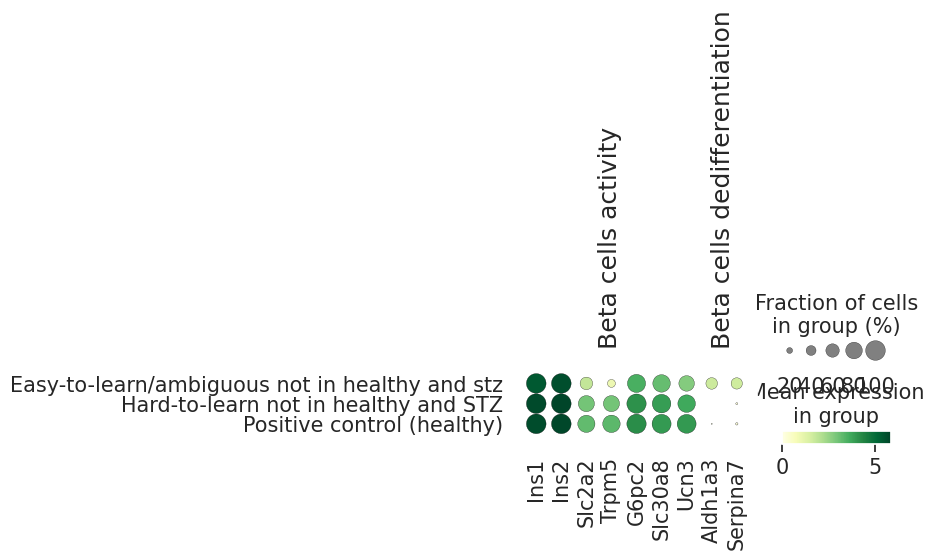

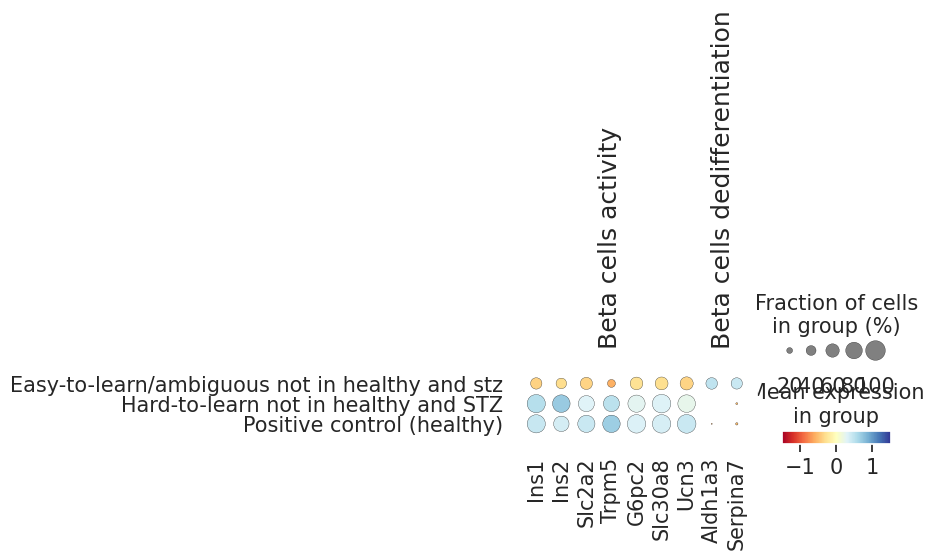

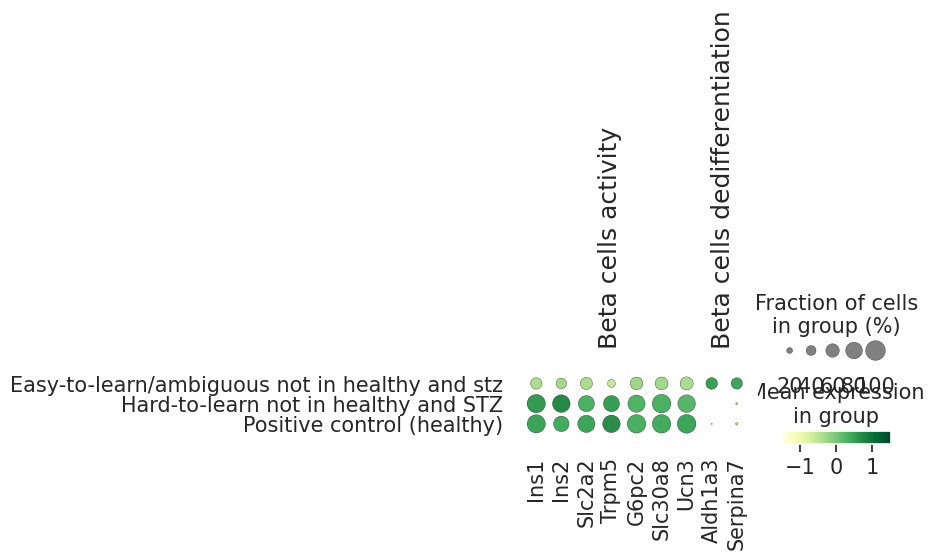

43

In [92]:

adata_beta_stz_ctrl = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E','beta_Ctrl'])]
adata_beta_stz_ctrl.obs['conf_binaries'] = pd.Categorical((adata_beta_stz_ctrl.obs['conf'] > 0.15)
                                                        | (adata_beta_stz_ctrl.obs['var'] > 0.15))

corr_classified_list =[]
count = 0
for i in range(adata_beta_stz_ctrl.n_obs):
    if adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('Positive control (healthy)')
    # elif adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_STZ':
    #     corr_classified_list.append('Negative control (STZ)')
    elif adata_beta_stz_ctrl.obs['conf_binaries'][i]==True:
        corr_classified_list.append('Easy-to-learn/ambiguous not in healthy and stz')
    else:
        corr_classified_list.append('Hard-to-learn not in healthy and STZ')
        count +=1
        print(adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i])
adata_beta_stz_ctrl.obs['annotation']=corr_classified_list
order =['Positive control (healthy)','Easy-to-learn/ambiguous not in healthy and stz','Hard-to-learn not in healthy and STZ']
order=['Easy-to-learn/ambiguous not in healthy and stz','Hard-to-learn not in healthy and STZ','Positive control (healthy)']
ax = sc.pl.dotplot(adata_beta_stz_ctrl, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=order)
temp_annotation_scaled = adata_beta_stz_ctrl.copy()

sc.pp.scale(temp_annotation_scaled)
ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,categories_order=order,show=False)
ax['mainplot_ax'].get_figure().savefig('figures/beta_cells_K.png',dpi=600)
plt.show()



ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=order,vmin=-1.5,vmax=1.5)
# print(len(corr_classified_list))
count

/tmp/ipykernel_3484516/2820727404.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_beta_stz_ctrl.obs['conf_binaries'] = pd.Categorical((adata_beta_stz_ctrl.obs['conf'] > 0.15)
/tmp/ipykernel_3484516/2820727404.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
/tmp/ipykernel_3484516/2820727404.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif adata_beta_stz_ctrl.obs['conf_binaries'][i]==True:
/tmp/ipykernel_3484516/2820727404.py:17: FutureWarning: Series.__getitem__ treatin

beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_GLP1E
beta_GLP1E
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1


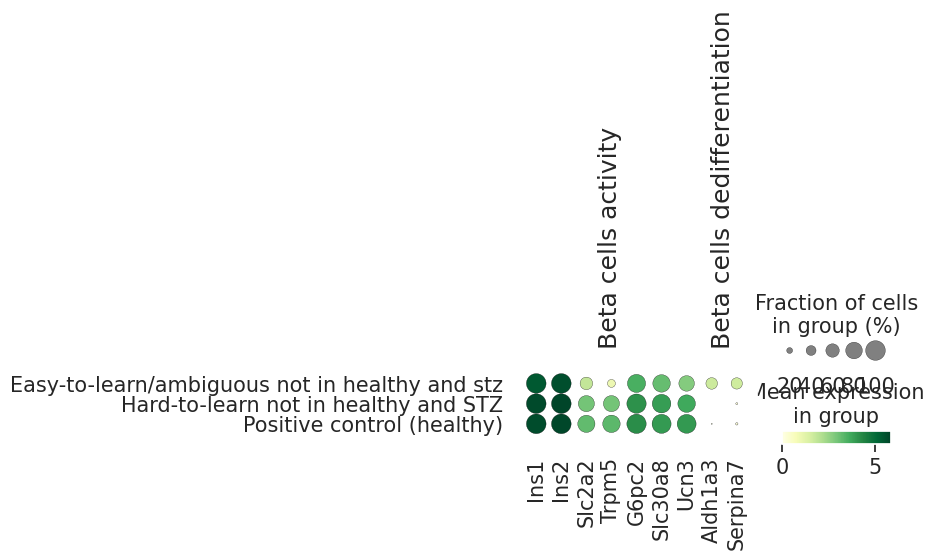

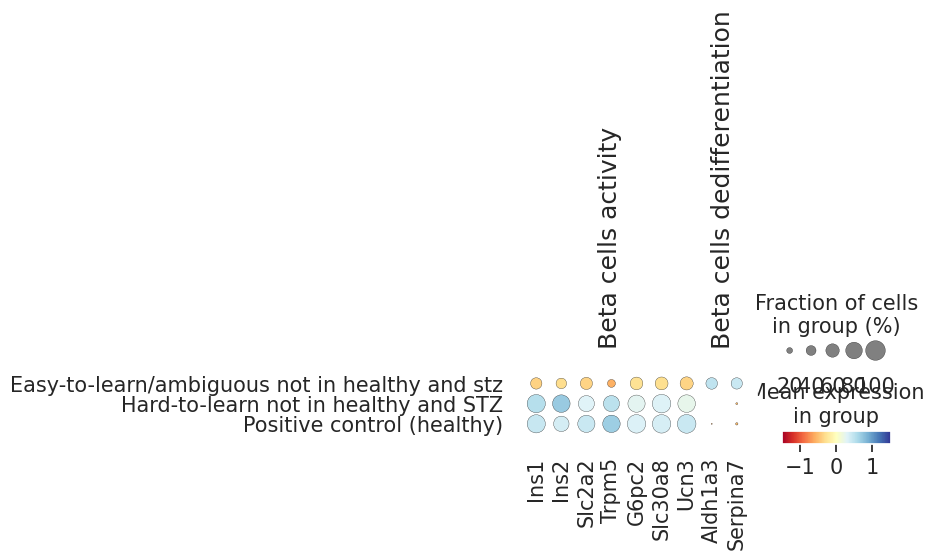

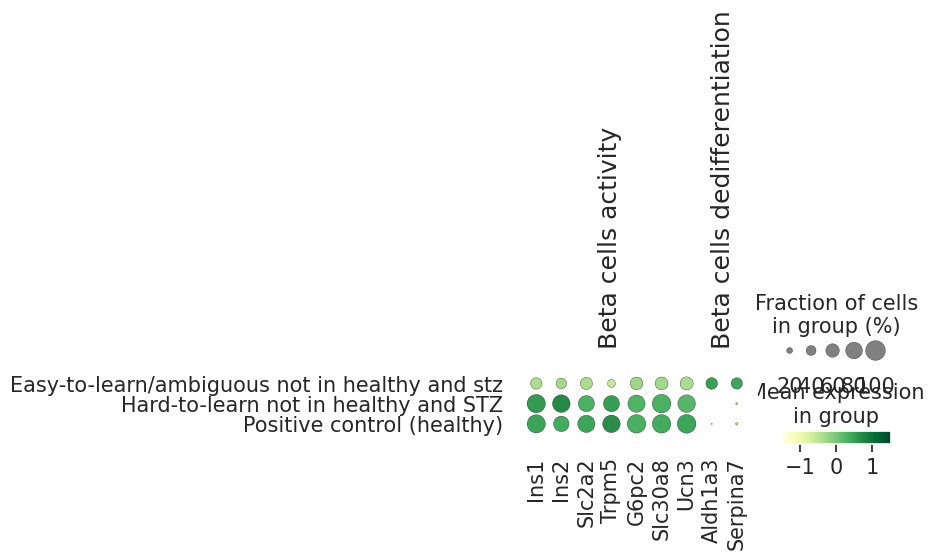

43

In [93]:

adata_beta_stz_ctrl = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E','beta_Ctrl'])]
adata_beta_stz_ctrl.obs['conf_binaries'] = pd.Categorical((adata_beta_stz_ctrl.obs['conf'] > 0.15)
                                                        | (adata_beta_stz_ctrl.obs['var'] > 0.15))

corr_classified_list =[]
count = 0
for i in range(adata_beta_stz_ctrl.n_obs):
    if adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('Positive control (healthy)')
    # elif adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_STZ':
    #     corr_classified_list.append('Negative control (STZ)')
    elif adata_beta_stz_ctrl.obs['conf_binaries'][i]==True:
        corr_classified_list.append('Easy-to-learn/ambiguous not in healthy and stz')
    else:
        corr_classified_list.append('Hard-to-learn not in healthy and STZ')
        count +=1
        print(adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i])
adata_beta_stz_ctrl.obs['annotation']=corr_classified_list
order =['Positive control (healthy)','Easy-to-learn/ambiguous not in healthy and stz','Hard-to-learn not in healthy and STZ']
order=['Easy-to-learn/ambiguous not in healthy and stz','Hard-to-learn not in healthy and STZ','Positive control (healthy)']
ax = sc.pl.dotplot(adata_beta_stz_ctrl, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=order)
temp_annotation_scaled = adata_beta_stz_ctrl.copy()

sc.pp.scale(temp_annotation_scaled)
ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,categories_order=order,save='beta_cells_a.png')


ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=order,vmin=-1.5,vmax=1.5)
count

/tmp/ipykernel_3484516/3123683170.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_beta_stz_ctrl.obs['conf_binaries'] = pd.Categorical((adata_beta_stz_ctrl.obs['conf'] > 0.15)
/tmp/ipykernel_3484516/3123683170.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
/tmp/ipykernel_3484516/3123683170.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif adata_beta_stz_ctrl.obs['conf_binaries'][i]==True:
/tmp/ipykernel_3484516/3123683170.py:16: FutureWarning: Series.__getitem__ treati

beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_Ins
beta_GLP1E
beta_GLP1E
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1
beta_InsGLP1


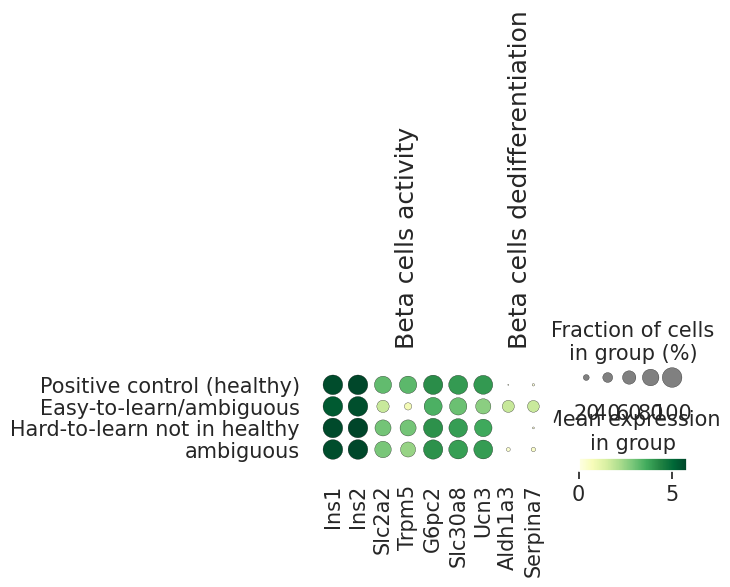

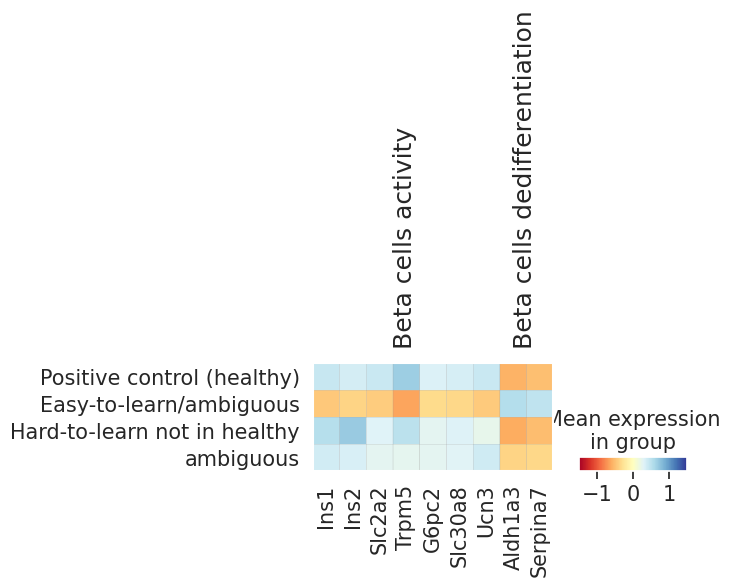

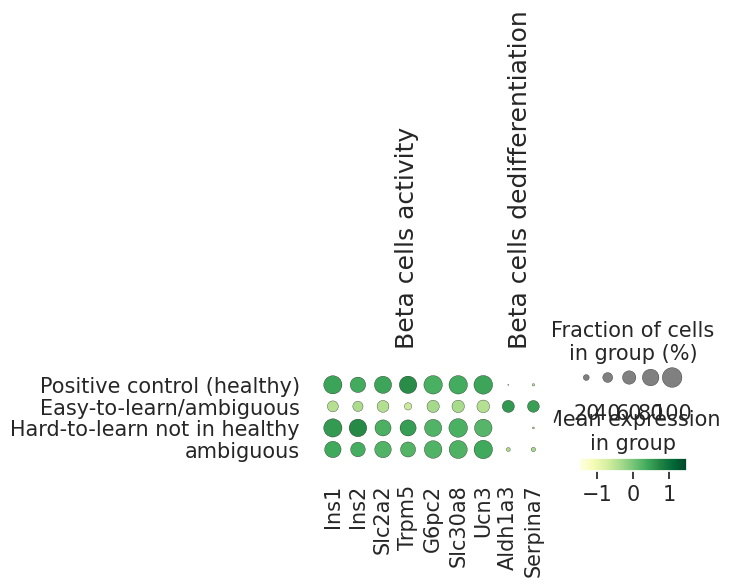

474


In [94]:
adata_beta_stz_ctrl = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E','beta_Ctrl'])]
adata_beta_stz_ctrl.obs['conf_binaries'] = pd.Categorical((adata_beta_stz_ctrl.obs['conf'] > 0.15)
                                                        | (adata_beta_stz_ctrl.obs['var'] > 0.15))
adata_beta_stz_ctrl.obs['conf_binaries_2'] = pd.Categorical((adata_beta_stz_ctrl.obs['conf'] < 0.8))


corr_classified_list =[]
count = 0
COUNT_2 = 0
for i in range(adata_beta_stz_ctrl.n_obs):
    if adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('Positive control (healthy)')
    # elif adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i]=='beta_STZ':
    #     corr_classified_list.append('Negative control (STZ)')
    elif adata_beta_stz_ctrl.obs['conf_binaries'][i]==True:
        if adata_beta_stz_ctrl.obs['conf_binaries_2'][i]==True:
            corr_classified_list.append('ambiguous')
            COUNT_2 +=1
        else:
            corr_classified_list.append('Easy-to-learn/ambiguous')
    else:
        corr_classified_list.append('Hard-to-learn not in healthy')
        count +=1
        print(adata_beta_stz_ctrl.obs['groups_named_broad_cond'][i])
adata_beta_stz_ctrl.obs['annotation']=corr_classified_list
order =['Positive control (healthy)','Easy-to-learn/ambiguous','Hard-to-learn not in healthy','ambiguous']
ax = sc.pl.dotplot(adata_beta_stz_ctrl, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=order)
temp_annotation_scaled = adata_beta_stz_ctrl.copy()

sc.pp.scale(temp_annotation_scaled)
ax = sc.pl.matrixplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,categories_order=order)
#
# ax = sc.pl.matrixplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,categories_order=order,save='beta_cells_b.png')

ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=order,vmin=-1.5,vmax=1.5)
# print(len(corr_classified_list))
print(COUNT_2)

In [95]:
adata_beta_ctrl

View of AnnData object with n_obs × n_vars = 5664 × 2319
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'groups', 'treatment', 'groups_named_broad', 'S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man', 'doublet_score', 'groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst', 'groups_named_broad_cond', 'cond', 'batch', 'conf', 'var'
    var: 'n_cells', 'highly_variable_genes', 'means', 'dispersions', 'dispersions_norm', 'n_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'cond_colors', 'groups_named_broad_cond_colors'
    obsm: 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

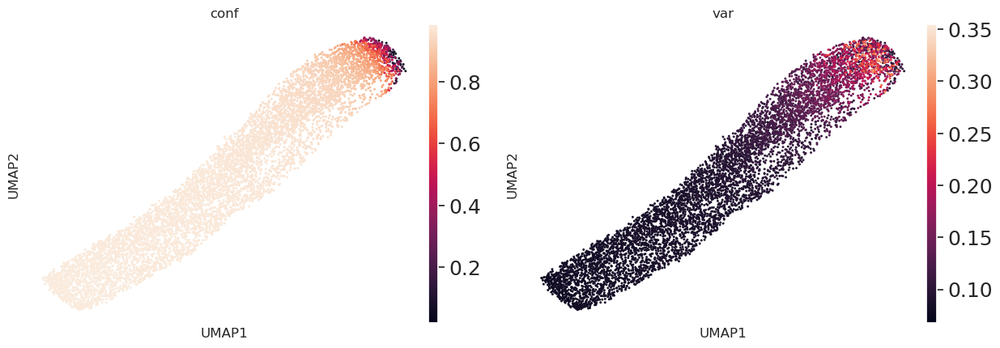

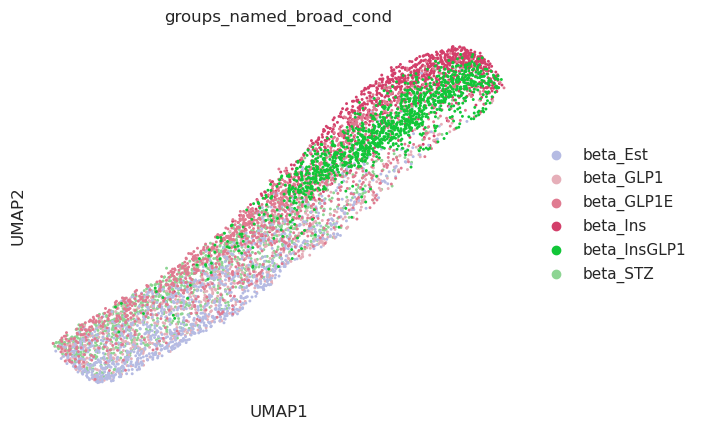

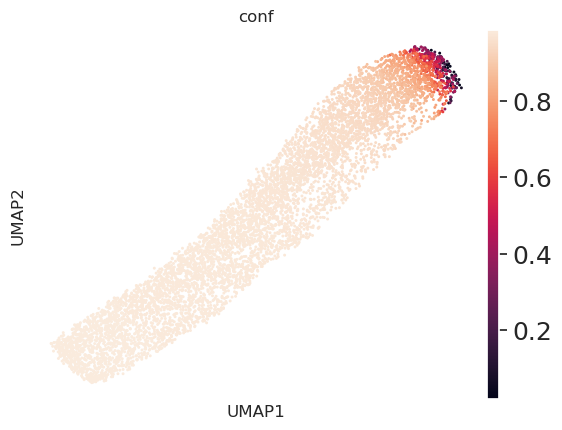

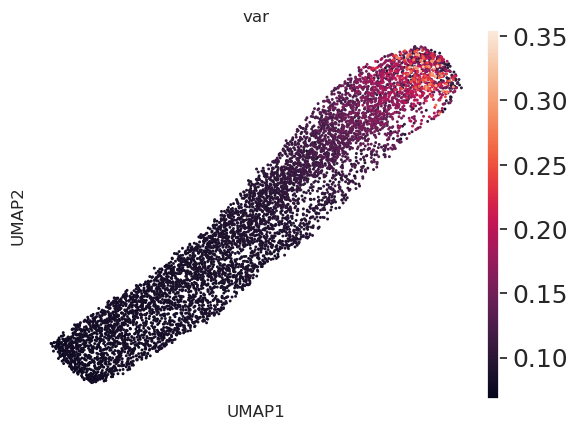

In [96]:

adata_beta_stz_for_graph = adata_beta_stz.copy()

connectivities_graph , distance_graph  = metrics.make_conf_graph(adata_beta_stz_for_graph.copy(), alpha=0.65 , k=15)

adata_beta_stz_for_graph.obsp['connectivities']=sparse.csr_matrix(connectivities_graph)
sc.tl.umap(adata_beta_stz_for_graph)
sc.pl.umap(adata_beta_stz_for_graph, color=['conf','var'])
sc.pl.umap(adata_beta_stz_for_graph,color=['groups_named_broad_cond'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph,color=['var'])
# sc.pl.umap(adata_beta_stz_for_graph,color=['annotation'])


sorted_indices_conf = np.argsort(adata_beta_stz_for_graph.obs['conf'])
positions_conf = np.empty_like(sorted_indices_conf)
positions_conf[sorted_indices_conf] = np.arange(len((adata_beta_stz_for_graph.obs['conf'])))
n = len(sorted_indices_conf)

mean_distance_conf = metrics.mean_absolute_distance(n)





sorted_indices_var = np.argsort(adata_beta_stz_for_graph.obs['var'])
positions_var = np.empty_like(sorted_indices_var)
positions_var[sorted_indices_var] = np.arange(len((adata_beta_stz_for_graph.obs['var'])))





# adata_beta_stz_for_graph.obs['var_position'] = positions_var/mean_distance_conf
# adata_beta_stz_for_graph.obs['conf_position'] = positions_conf/mean_distance_conf
    # for i in range(n):

adata_beta_stz_for_graph.obs['var_position'] = positions_var
adata_beta_stz_for_graph.obs['conf_position'] = positions_conf


In [113]:

sorted_indices_conf = np.argsort(adata_stz_ctrl.obs['conf'])
positions_conf = np.empty_like(sorted_indices_conf)
positions_conf[sorted_indices_conf] = np.arange(len((adata_stz_ctrl.obs['conf'])))
n = len(sorted_indices_conf)

mean_distance_conf = metrics.mean_absolute_distance(n)





sorted_indices_var = np.argsort(adata_stz_ctrl.obs['var'])
positions_var = np.empty_like(sorted_indices_var)
positions_var[sorted_indices_var] = np.arange(len((adata_stz_ctrl.obs['var'])))


# adata_stz_ctrl.obs['var_position'] = positions_var/mean_distance_conf
# adata_stz_ctrl.obs['conf_position'] = positions_conf/mean_distance_conf


adata_stz_ctrl.obs['var_position'] = positions_var
adata_stz_ctrl.obs['conf_position'] = positions_conf

In [114]:
# mean_distance_conf = metrics.mean_absolute_distance(n)
#
# sorted_indices_conf = np.argsort(adata_beta_stz_for_graph.obs['conf'])
# positions_conf = np.empty_like(sorted_indices_conf)
# positions_conf[sorted_indices_conf] = np.arange(len((adata_beta_stz_for_graph.obs['conf'])))
# n = len(sorted_indices_conf)
#
#
#
# sorted_indices_var = np.argsort(adata_beta_stz_for_graph.obs['var'])
# positions_var = np.empty_like(sorted_indices_var)
# positions_var[sorted_indices_var] = np.arange(len((adata_beta_stz_for_graph.obs['var'])))
#
#
#
#
#
# adata_beta_stz_for_graph.obs['var_position'] = positions_var/mean_distance_conf
# adata_beta_stz_for_graph.obs['conf_position'] = positions_conf/mean_distance_conf
#
# sc.pl.umap(adata_beta_stz_for_graph,color=['var_position'])
# sc.pl.umap(adata_beta_stz_for_graph,color=['conf_position'])


<Figure size 640x480 with 0 Axes>

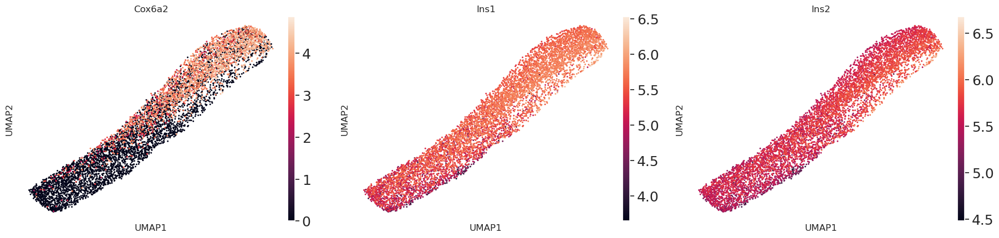

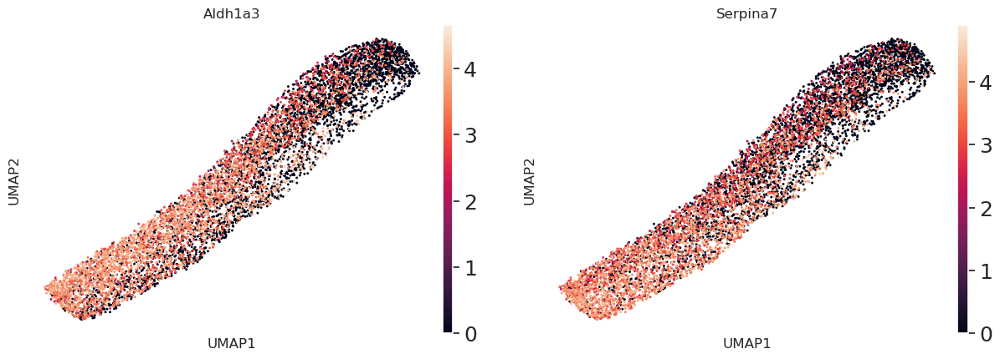

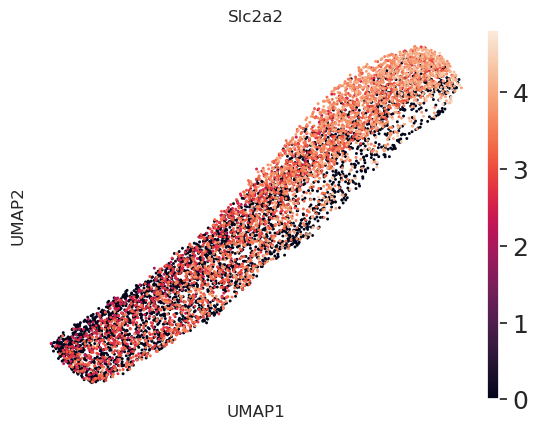

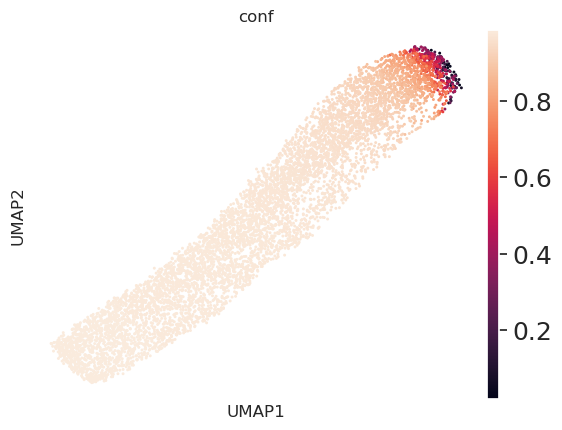

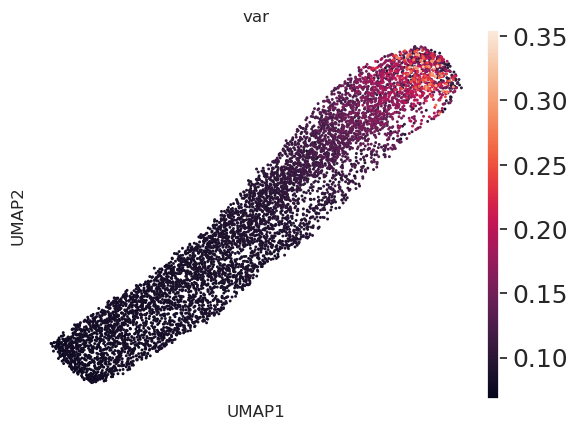

...

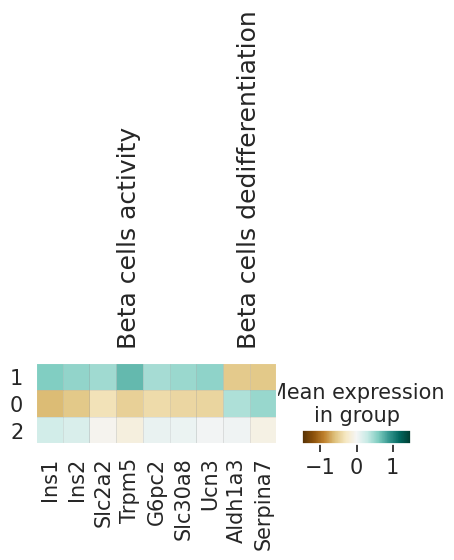

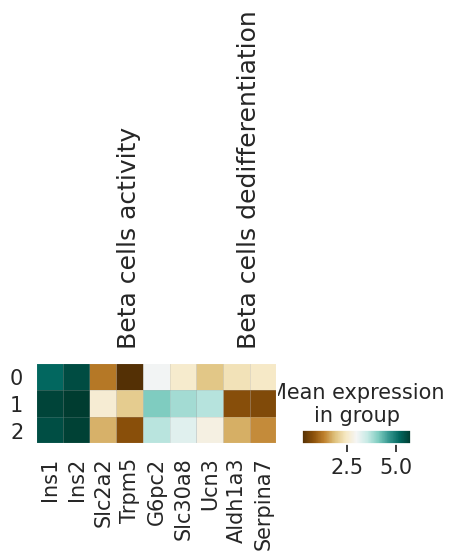

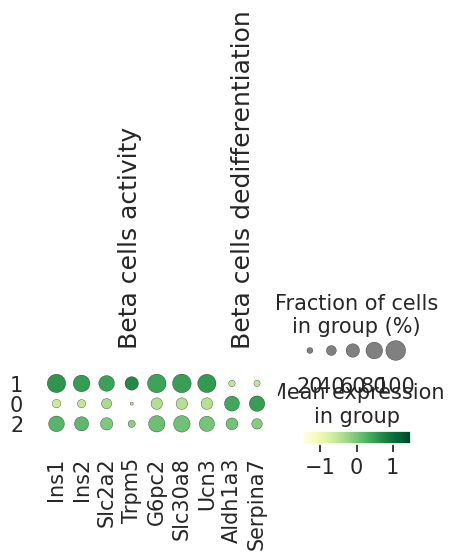

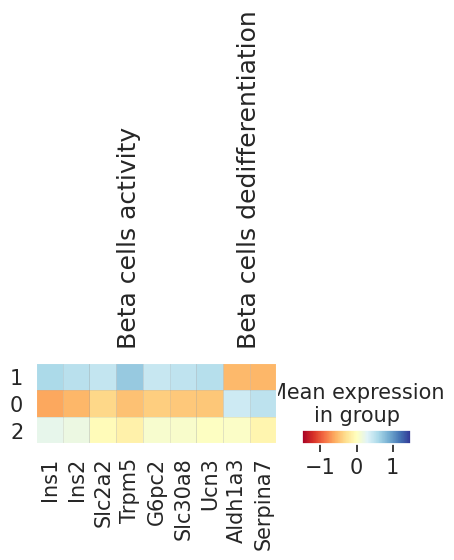

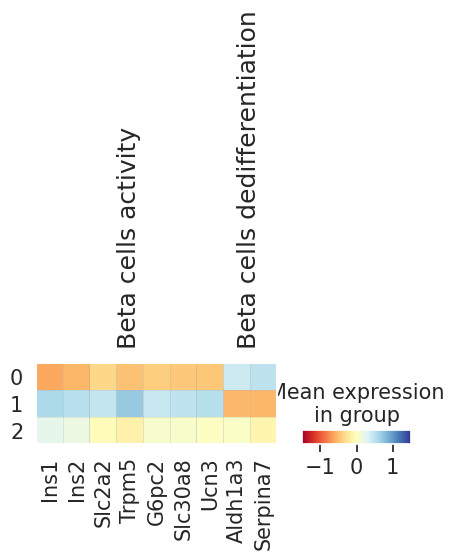

graph
0
-1.741252
Slc2a2
0
-3.6360605
Trpm5
0
-2.0333958
Ucn3
0
-0.29012445
Ins2
0
-1.3057619
G6pc2
0
-1.5230932
Slc30a8
0
-0.58952105
Ins1
$$$$$$
Mean of embedded graph logfold change: -1.5884584
1
1.4810512
Slc30a8
1
2.1004915
Ucn3
1
0.49325415
Ins1
1
1.2338128
G6pc2
1
3.538809
Trpm5
1
0.2465891
Ins2
1
1.955505
Slc2a2
$$$$$$
Mean of embedded graph logfold change: 1.5785018
2
0.16951396
Ins1
2
0.07918251
Ins2
2
0.20604889
G6pc2
2
0.18369414
Slc30a8
2
0.0736036
Ucn3
2
-0.17903166
Slc2a2
2
-0.65131897
Trpm5
$$$$$$
Mean of embedded graph logfold change: -0.016901085
0
2.6323073
Serpina7
0
2.098572
Aldh1a3
$$$$$$
Mean of embedded graph logfold change: 2.3654397
1
-2.7345147
Aldh1a3
1
-2.831438
Serpina7
$$$$$$
Mean of embedded graph logfold change: -2.7829764
2
0.15593925
Aldh1a3
2
-0.431235
Serpina7
$$$$$$
Mean of embedded graph logfold change: -0.13764787


<Figure size 640x480 with 0 Axes>

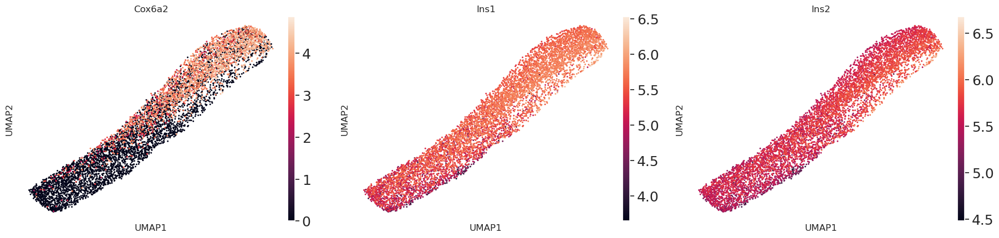

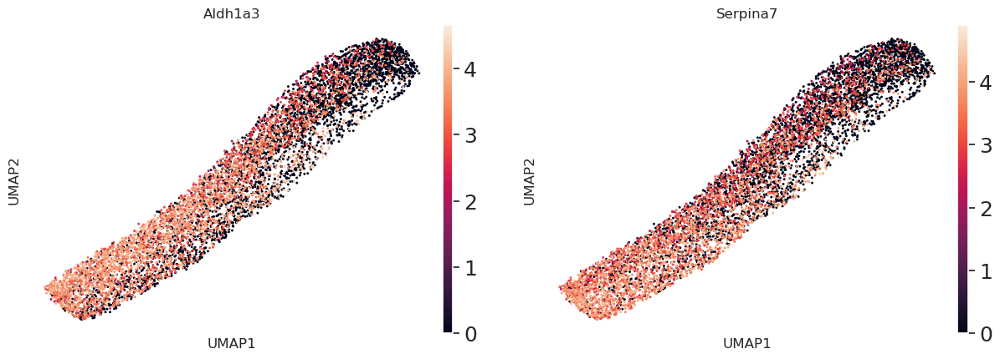

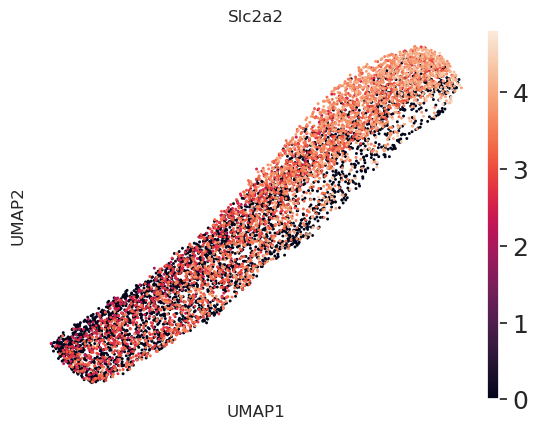

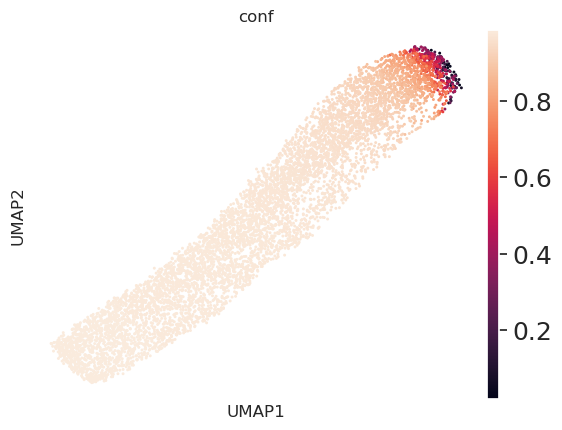

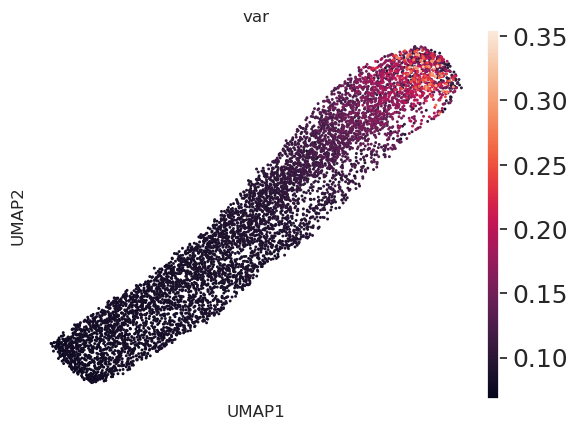

...

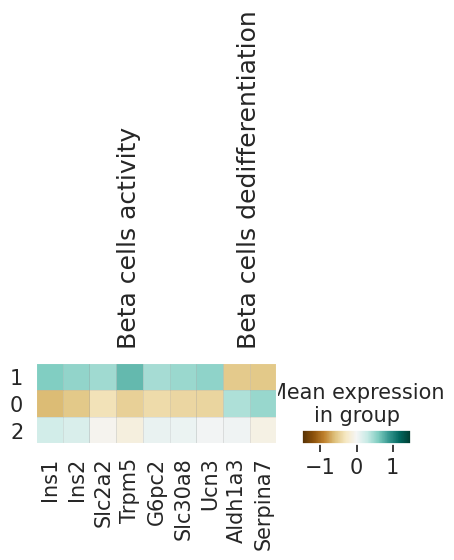

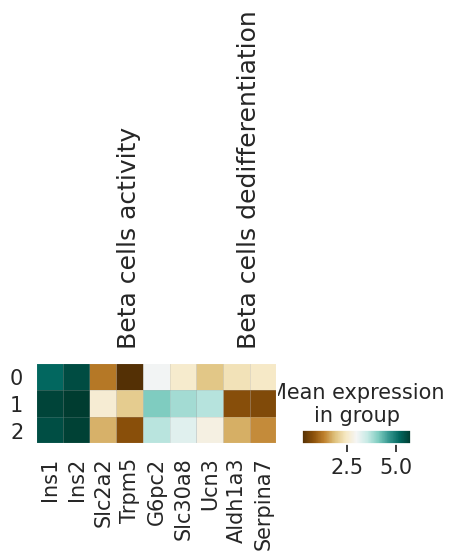

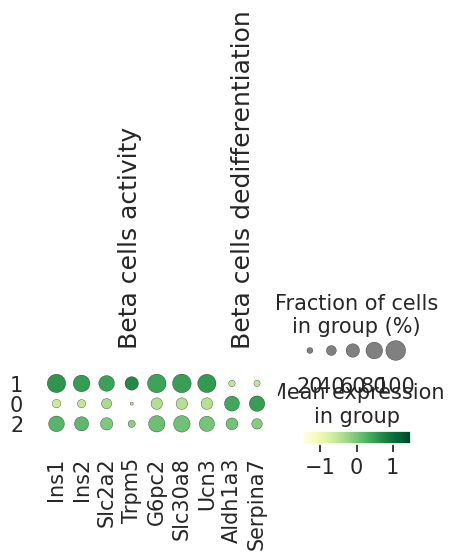

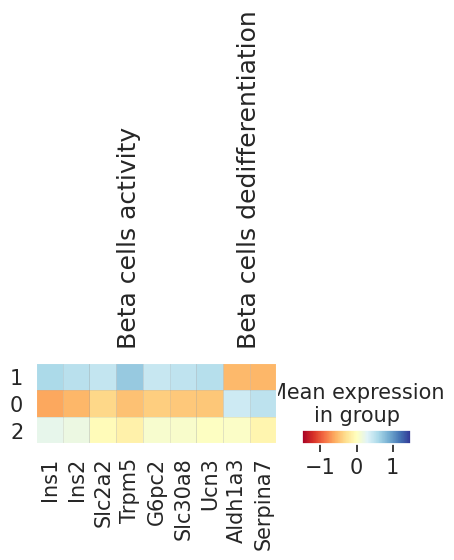

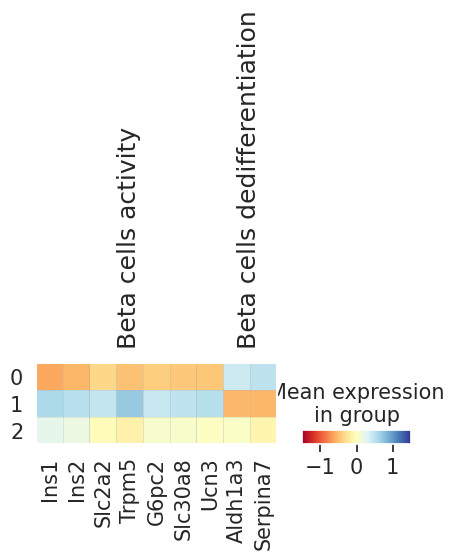

graph
0
-1.741252
Slc2a2
0
-3.6360605
Trpm5
0
-2.0333958
Ucn3
0
-0.29012445
Ins2
0
-1.3057619
G6pc2
0
-1.5230932
Slc30a8
0
-0.58952105
Ins1
$$$$$$
Mean of embedded graph logfold change: -1.5884584
1
1.4810512
Slc30a8
1
2.1004915
Ucn3
1
0.49325415
Ins1
1
1.2338128
G6pc2
1
3.538809
Trpm5
1
0.2465891
Ins2
1
1.955505
Slc2a2
$$$$$$
Mean of embedded graph logfold change: 1.5785018
2
0.16951396
Ins1
2
0.07918251
Ins2
2
0.20604889
G6pc2
2
0.18369414
Slc30a8
2
0.0736036
Ucn3
2
-0.17903166
Slc2a2
2
-0.65131897
Trpm5
$$$$$$
Mean of embedded graph logfold change: -0.016901085
0
2.6323073
Serpina7
0
2.098572
Aldh1a3
$$$$$$
Mean of embedded graph logfold change: 2.3654397
1
-2.7345147
Aldh1a3
1
-2.831438
Serpina7
$$$$$$
Mean of embedded graph logfold change: -2.7829764
2
0.15593925
Aldh1a3
2
-0.431235
Serpina7
$$$$$$
Mean of embedded graph logfold change: -0.13764787


In [115]:
sns.despine()

sc.pl.umap(adata_beta_stz_for_graph,color=['Cox6a2','Ins1','Ins2'])
sc.pl.umap(adata_beta_stz_for_graph,color=['Aldh1a3','Serpina7'])
sc.pl.umap(adata_beta_stz_for_graph,color=['Slc2a2'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph,color=['var'])
sc.pl.umap(adata_beta_stz_for_graph,color=['var_position'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf_position'])


sc.pl.umap(adata_beta_stz_for_graph,color=['conf_position'],cmap='RdYlBu',save='v5_conf_position.png')
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'],cmap='RdYlBu',save='v5_conf.png')
sc.pl.umap(adata_beta_stz_for_graph,color=['Slc2a2'],cmap='RdYlBu',save='v5_Slc2a2.png')
sc.pl.umap(adata_beta_stz_for_graph,color=['Ins1'],cmap='RdYlBu',vmin=4.5,vmax=6,save='v5_Ins1.png')

colors_dict = {
    'green': '#2AA148',
    'blue': '#1D77B5',
    'orange': '#F57E20'
}
# costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green']]
costum_colors = [colors_dict['orange'],colors_dict['green'],colors_dict['blue']]




# sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.2)
sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.2)
sc.pl.umap(adata_beta_stz_for_graph,color=['louvain'],save='v5_cluster_umap.png',palette=costum_colors)
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph,color=['var'])
sc.pl.umap(adata_beta_stz_for_graph,color=['groups_named_broad_cond'])
adata_beta_stz_graph = adata_beta_stz_for_graph[adata_beta_stz_for_graph.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_GLP1','beta_Ins','beta_InsGLP1','beta_Est','beta_GLP1E'])].copy()
sc.tl.rank_genes_groups(adata_beta_stz_graph, 'louvain' ,method='wilcoxon')
sc.pl.rank_genes_groups(adata_beta_stz_graph, n_genes=25, sharey=False)
adata_beta_stz_for_graph_scaled = adata_beta_stz_for_graph.copy()
sc.pp.scale(adata_beta_stz_for_graph_scaled)

ax = sc.pl.matrixplot(adata_beta_stz_for_graph_scaled, beta_cells_genes_dict, groupby='louvain',cmap='BrBG')


ax = sc.pl.matrixplot(adata_beta_stz_for_graph_scaled, beta_cells_genes_dict, groupby='louvain',cmap='BrBG',vmin=-1.5,vmax=1.5,categories_order=['1','0','2'])
ax = sc.pl.matrixplot(adata_beta_stz_for_graph, beta_cells_genes_dict, groupby='louvain',cmap='BrBG')
ax = sc.pl.dotplot(adata_beta_stz_for_graph_scaled, beta_cells_genes_dict, groupby='louvain',cmap='YlGn',categories_order=['1','0','2'],vmin=-1.5,vmax=1.5)

ax = sc.pl.matrixplot(adata_beta_stz_for_graph_scaled, beta_cells_genes_dict, groupby='louvain',cmap='RdYlBu',categories_order=['1','0','2'],vmin=-1.5,vmax=1.5)
# adata_ctrl
ax = sc.pl.matrixplot(adata_beta_stz_for_graph_scaled, beta_cells_genes_dict, groupby='louvain',cmap='RdYlBu',vmin=-1.5,vmax=1.5)




b_cells_activity = ['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2', 'Slc30a8', 'Ucn3']


print("graph")
for cluster_num in range(3):
    b_cells_activity_graph = []
    for i , j  in enumerate(adata_beta_stz_graph.uns['rank_genes_groups']['names']):
        if j[cluster_num] in b_cells_activity:
            print(cluster_num)
            print(adata_beta_stz_graph.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
            print(j[cluster_num])
            b_cells_activity_graph.append(adata_beta_stz_graph.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
    print("$$$$$$")

    print("Mean of embedded graph logfold change: " + str(np.mean(np.array(b_cells_activity_graph))))
dedef = ['Aldh1a3', 'Serpina7']
for cluster_num in range(3):
    b_cells_activity_graph = []
    for i , j  in enumerate(adata_beta_stz_graph.uns['rank_genes_groups']['names']):
        if j[cluster_num] in dedef:
            print(cluster_num)
            print(adata_beta_stz_graph.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
            print(j[cluster_num])
            b_cells_activity_graph.append(adata_beta_stz_graph.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
    print("$$$$$$")

    print("Mean of embedded graph logfold change: " + str(np.mean(np.array(b_cells_activity_graph))))
average_expression_values_activity_dict = {}
average_expression_dediffy_dict ={}
# Loop through each gene in the list





/tmp/ipykernel_3484516/2297550949.py:4: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
/tmp/ipykernel_3484516/2297550949.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
/tmp/ipykernel_3484516/2297550949.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will al

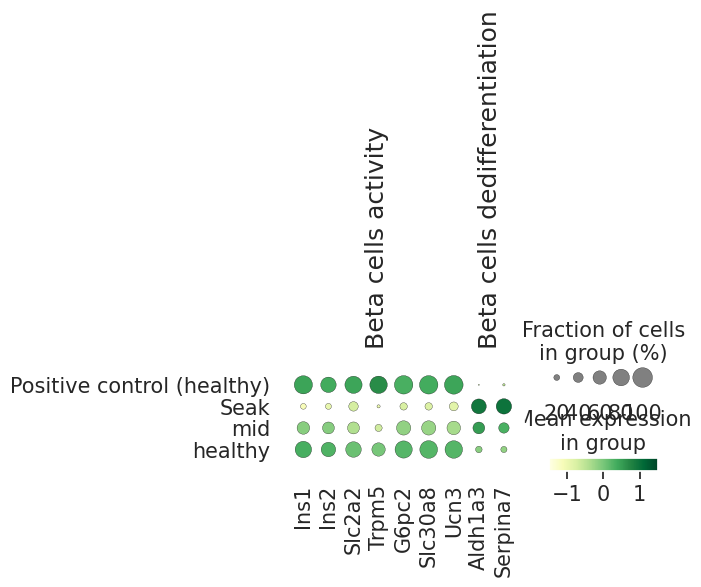

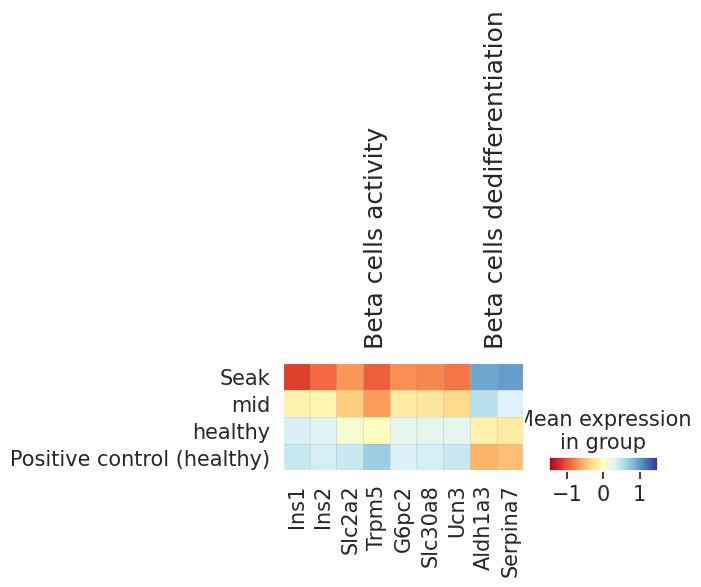

In [116]:
#fig c and j 
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
# temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.n_obs):
    if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('Positive control (healthy)')
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='1':
        corr_classified_list.append("healthy")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='0':
        corr_classified_list.append("Seak")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='2':
        corr_classified_list.append("mid")
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation']=corr_classified_list
sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
ax = sc.pl.dotplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=['Positive control (healthy)',"Seak","mid","healthy"],vmin=-1.5,vmax=1.5)

# ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',
#                       categories_order=['Positive control (healthy)',"Seak","mid","healthy"],vmin=-1.5,vmax=1.5,save='beta_cells_c.png')

ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',
                      categories_order=["Seak","mid","healthy",'Positive control (healthy)'],vmin=-1.5,vmax=1.5,save='beta_cells_c.png')
#
# temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp[temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'].isin(["beta_Ins","beta_InsGLP1","beta_Ctrl"])]
# temp_ = temp[temp.obs['annotation'].isin(['Positive control (healthy)',"mid","healthy"])]
#
#
#
#
# ax = sc.pl.dotplot(temp_, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,save='beta_cells_j_ins_only.png',categories_order=["mid","healthy",'Positive control (healthy)'])
# ax = sc.pl.matrixplot(temp_, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5)
#
# temp_v = temp[temp.obs['annotation'].isin(["mid"])]
# print(temp_v)
# temp_v = temp[temp.obs['annotation'].isin(["healthy"])]
# print(temp_v)
# temp_v = temp[temp.obs['annotation'].isin(["Seak"])]


In [107]:
all=818+1431+10
print("mid",818/all)
print("healthy",1431/all)
print("Seak",10/all)




mid 0.3621071270473661
healthy 0.6334661354581673
Seak 0.004426737494466578


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


AnnData object with n_obs × n_vars = 2732 × 2319
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'groups', 'treatment', 'groups_named_broad', 'S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man', 'doublet_score', 'groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst', 'groups_named_broad_cond', 'cond', 'batch', 'conf', 'var', 'var_position_v2', 'conf_position_v2', 'var_position', 'conf_position', 'louvain', 'annotation'
    var: 'n_cells', 'highly_variable_genes', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    obsm: 'X_umap', 'X_pca'
Seak
AnnData object with n_obs × n_vars = 1800 × 2319
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'groups', 'treatment', 'groups_named_broad', 'S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man', 'doublet_score', 'groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst', 'groups_named_broad_cond', 'cond', 'batch', 'conf', 'var', 'var_position_v2', 'conf

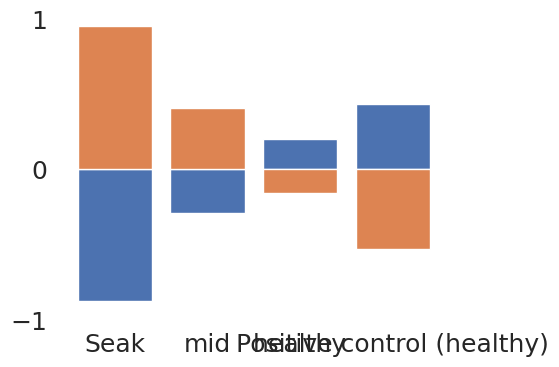

AnnData object with n_obs × n_vars = 12414 × 2319
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'groups', 'treatment', 'groups_named_broad', 'S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man', 'doublet_score', 'groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst', 'groups_named_broad_cond', 'cond', 'batch', 'conf', 'var', 'var_position_v2', 'conf_position_v2', 'var_position', 'conf_position', 'louvain', 'annotation'
    var: 'n_cells', 'highly_variable_genes', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    obsm: 'X_umap', 'X_pca'

In [108]:
average_expression_values_activity_dict = {}
average_expression_dediffy_dict ={}

for cluster in ["Seak", "mid", "healthy", "Positive control (healthy)"]:
    #if cluster key is not in the dictionary, add it
    if cluster not in average_expression_values_activity_dict:
        average_expression_values_activity_dict[cluster] = []
    if cluster not in average_expression_dediffy_dict:
        average_expression_dediffy_dict[cluster] = []
    temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp[temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation'].isin([cluster])].copy()
    print(temp)
    print(cluster)
    for gene in b_cells_activity:
        gene_index = temp.var_names.get_loc(gene)
        gene_expression_values = temp.X[:, gene_index]
        average_expression_values_activity_dict[cluster].append(np.mean(gene_expression_values))
    for gene in dedef:
        gene_index = temp.var_names.get_loc(gene)
        gene_expression_values = temp.X[:, gene_index]
        average_expression_dediffy_dict[cluster].append(np.mean(gene_expression_values))

# Calculate the final average of the average gene expression values

print(average_expression_values_activity_dict)
print(average_expression_dediffy_dict)
#convert the dictionary so that each list will be the mean value of the gene expression values
for cluster in average_expression_values_activity_dict:
    average_expression_values_activity_dict[cluster] = np.mean(average_expression_values_activity_dict[cluster])
    average_expression_dediffy_dict[cluster] = np.mean(average_expression_dediffy_dict[cluster])
print(average_expression_values_activity_dict)
print(average_expression_dediffy_dict)
#plot bott dicts in the same plot and change order of the bars
fig, ax = plt.subplots(figsize=(5,4))
# the order 1,0,2 is the order of the clusters
# ax.bar(average_expression_values_activity_dict.keys(), average_expression_values_activity_dict.values(), label='activity/maturation')
ax.bar(average_expression_values_activity_dict.keys(), average_expression_values_activity_dict.values())

# ax.bar(average_expression_dediffy_dict.keys(), average_expression_dediffy_dict.values(), label='dedifferentiation')
ax.bar(average_expression_dediffy_dict.keys(), average_expression_dediffy_dict.values())

plt.yticks([-1, 0, 1])
ax.legend()
plt.legend(frameon=False)
plt.savefig('figures/d_v4.png', dpi=600, bbox_inches='tight')
plt.savefig('figures/d_v4.svg', format='svg', dpi=600)
plt.show()
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp

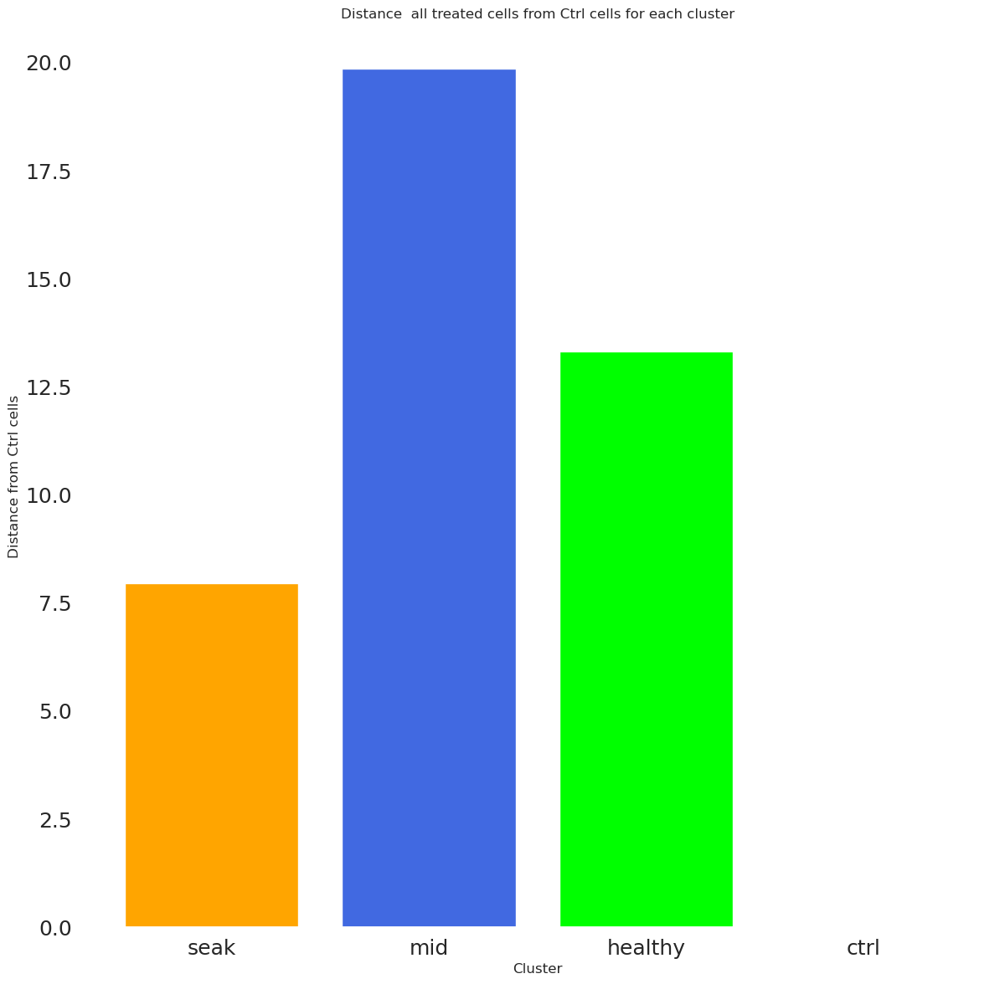

7.958415 19.867573 13.316337


In [109]:

ctrl_mean = np.mean(adata_beta_ctrl.X.toarray(), axis=0)
all_treated_list = []
for cluster in ['0','1','2']:
    temp = adata_beta_stz_for_graph[adata_beta_stz_for_graph.obs["louvain"].isin([cluster])].copy()


    adata_beta_only_all_treated_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]


    all_treated_mean_temp = np.mean(adata_beta_only_all_treated_temp.X.toarray(), axis=0)



    all_treated_list.append(np.linalg.norm(ctrl_mean-all_treated_mean_temp))


#plot the cluster and all_treated_dist as a bar graph
plt.figure(figsize=(14,14))
plt.bar(np.arange(0,4), [all_treated_list[1],all_treated_list[0],all_treated_list[2],0],color =['orange','royalblue','lime','darkgreen'])
plt.xticks(np.arange(0,4), ['seak','mid','healthy','ctrl'])
plt.xlabel('Cluster')
plt.ylabel('Distance from Ctrl cells')
plt.title('Distance  all treated cells from Ctrl cells for each cluster')
# plt.savefig(f'figures/e_up.png')
plt.show()
print(all_treated_list[1],all_treated_list[0],all_treated_list[2])

0 stz
1 ins
2 glp1
3 Insglp1
4 Est
5 glp1e
6 all_treated


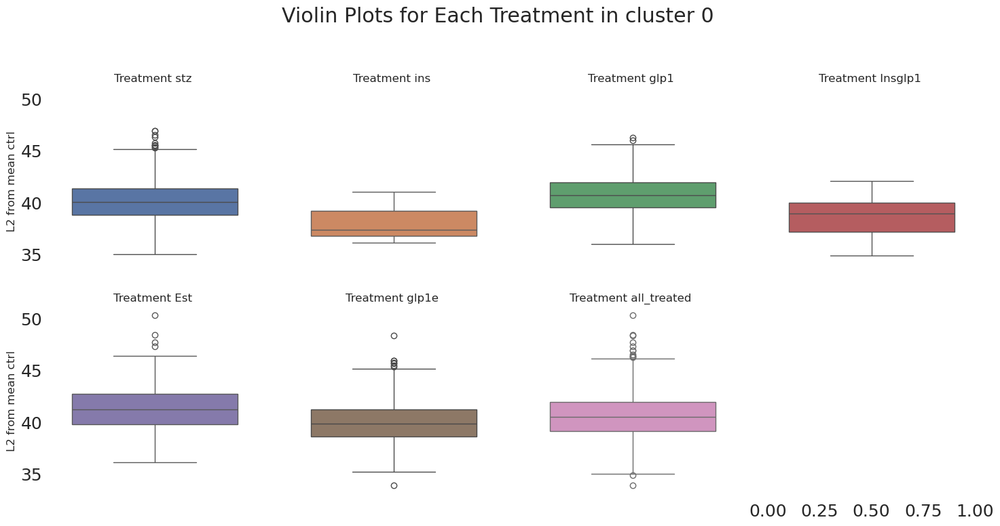

0 stz
1 ins
2 glp1
3 Insglp1
4 Est
5 glp1e
6 all_treated


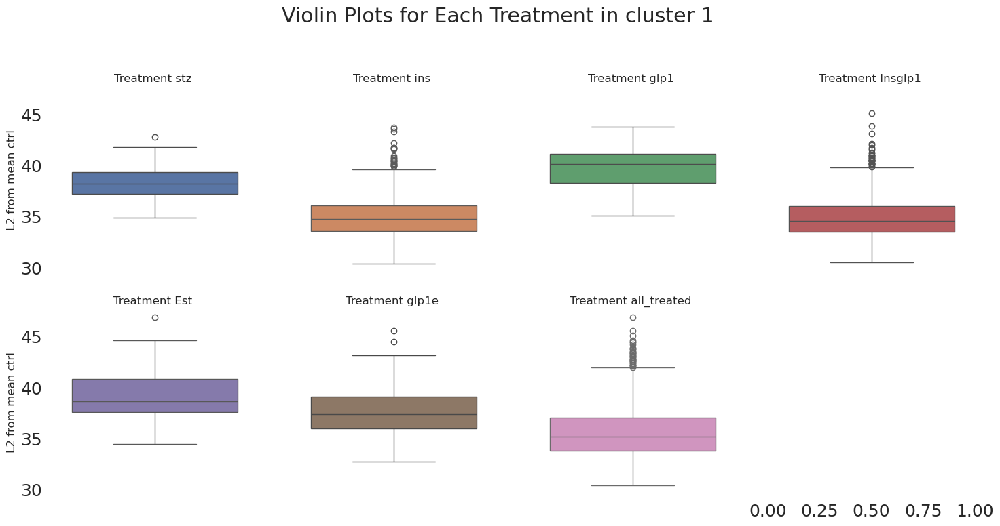

0 stz
1 ins
2 glp1
3 Insglp1
4 Est
5 glp1e
6 all_treated


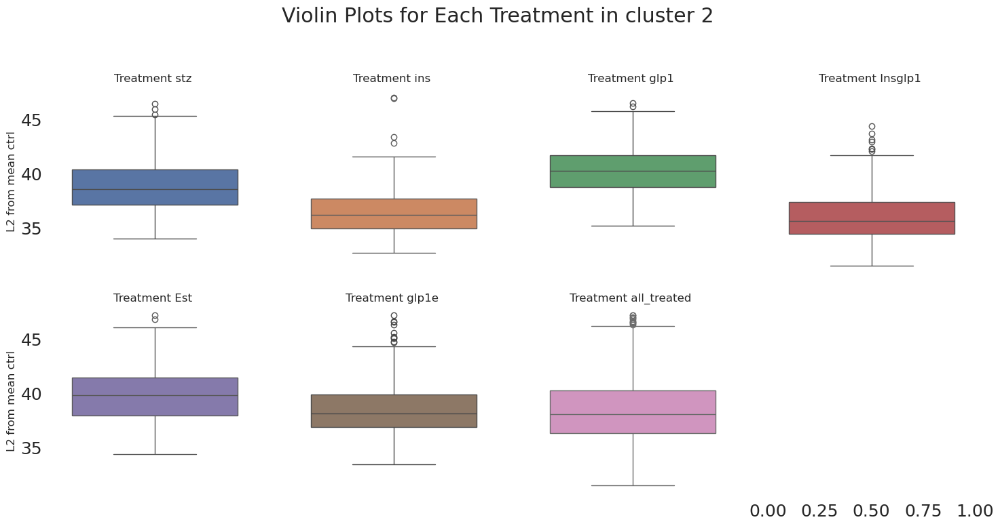

/tmp/ipykernel_3484516/1781340214.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['seak','mid','healthy like','ctrl'])


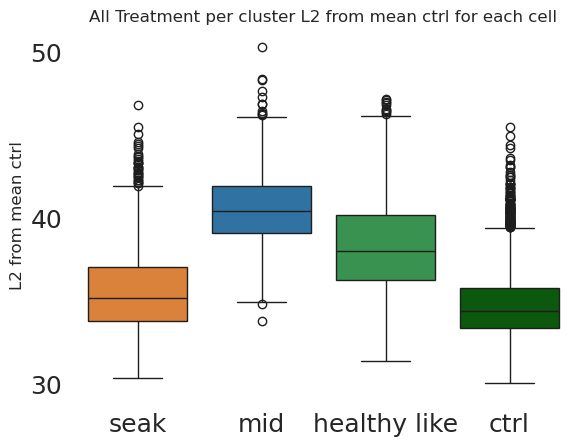

/tmp/ipykernel_3484516/1781340214.py:68: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['seak','mid','healthy like','ctrl'])


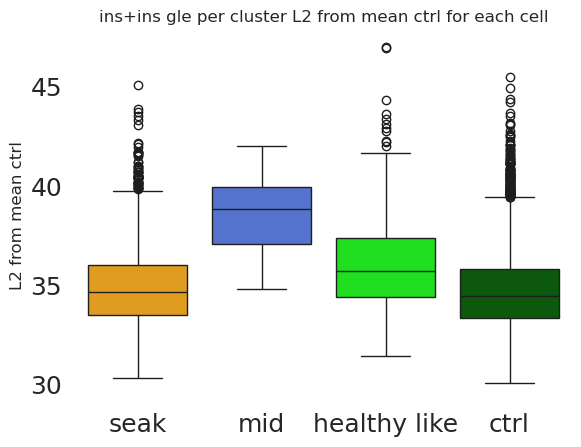

In [110]:

all_treated_per_cluster = []
all_treated_per_cluster_ins = []
ctrl_mean = np.mean(adata_beta_ctrl.X.toarray(), axis=0)
for cluster in ['0','1','2']:
    temp = adata_beta_stz_for_graph[adata_beta_stz_for_graph.obs["louvain"].isin([cluster])].copy()
    adata_beta_only_stz_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_STZ'])]
    adata_beta_only_ins_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_Ins'])]
    adata_beta_only_glp1_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_GLP1'])]
    adata_beta_only_Insglp1_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_InsGLP1'])]
    adata_beta_only_Est_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_Est'])]
    adata_beta_only_glp1e_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_GLP1E'])]

    adata_beta_all_ins = temp[temp.obs['groups_named_broad_cond'].isin(['beta_Ins','beta_InsGLP1'])]

    adata_beta_only_all_treated_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
    test_stz = np.linalg.norm(adata_beta_only_stz_temp.X.toarray() - ctrl_mean, axis=1)
    #
    test_ins = np.linalg.norm(adata_beta_only_ins_temp.X.toarray() - ctrl_mean, axis=1)
    test_glp1 = np.linalg.norm(adata_beta_only_glp1_temp.X.toarray() - ctrl_mean, axis=1)
    test_Insglp1 = np.linalg.norm(adata_beta_only_Insglp1_temp.X.toarray() - ctrl_mean, axis=1)
    test_Est = np.linalg.norm(adata_beta_only_Est_temp.X.toarray() - ctrl_mean, axis=1)
    test_glp1e = np.linalg.norm(adata_beta_only_glp1e_temp.X.toarray() - ctrl_mean, axis=1)
    test_all_treated = np.linalg.norm(adata_beta_only_all_treated_temp.X.toarray() - ctrl_mean, axis=1)
    all_treated_per_cluster.append(test_all_treated)
    arrays = [test_stz,test_ins,test_glp1,test_Insglp1,test_Est,test_glp1e,test_all_treated]
    all_ins_temp = np.linalg.norm(adata_beta_all_ins.X.toarray() - ctrl_mean, axis=1)
    all_treated_per_cluster_ins.append(all_ins_temp)
    names = ['stz', 'ins', 'glp1', 'Insglp1', 'Est', 'glp1e', 'all_treated']

    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), sharey=True)
    fig.suptitle(f'Violin Plots for Each Treatment in cluster {cluster}')


    colors =['orange','blue','lime','darkgreen']
    for i, (array, ax) in enumerate(zip(arrays, axes.flatten()), 0):
        print(i,names[i])


        sns.boxplot(y=array, ax=ax, color=f'C{i}')

        ax.set_title(f'Treatment {names[i]} ')
        ax.set_ylabel('L2 from mean ctrl')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    plt.show()

colors_dict = {
    'green': '#2AA148',
    'blue': '#1D77B5',
    'orange': '#F57E20'
}
# costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green']]
costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green'],'darkgreen']
test_ctrl = np.linalg.norm(adata_beta_ctrl.X.toarray() - ctrl_mean, axis=1)
to_plot = [all_treated_per_cluster[1],all_treated_per_cluster[0],all_treated_per_cluster[2],test_ctrl]
ax = sns.boxplot(data=to_plot,palette=costum_colors)
ax.set_title('All Treatment per cluster L2 from mean ctrl for each cell')
ax.set_xticklabels(['seak','mid','healthy like','ctrl'])
ax.set_ylabel('L2 from mean ctrl')
plt.yticks([30, 40, 50])
plt.savefig('figures/e_v4.png', dpi=600, bbox_inches='tight')
plt.savefig('figures/e_v4.svg', format='svg', dpi=600)
plt.show()
to_plot =[all_treated_per_cluster_ins[1],all_treated_per_cluster_ins[0],all_treated_per_cluster_ins[2],test_ctrl]
ax = sns.boxplot(data=to_plot,palette=['orange','royalblue','lime','darkgreen'])
ax.set_title('ins+ins gle per cluster L2 from mean ctrl for each cell')
ax.set_xticklabels(['seak','mid','healthy like','ctrl'])
ax.set_ylabel('L2 from mean ctrl')

#save fig

plt.show()


In [111]:


from scipy.sparse import csr_matrix
from scipy.sparse.linalg import norm
from sklearn.metrics import roc_auc_score , pairwise_distances

# Assuming 'adata' is your AnnData object
# Convert the data matrix to a sparse matrix
data_sparse = csr_matrix(adata_beta_ctrl.X)

# Compute pairwise distances
# distances = np.zeros((adata_beta_ctrl.X.shape[0], adata_beta_ctrl.X.shape[0]))
# for i in range(adata_beta_ctrl.X.shape[0]):
#     print(i)
#     for j in range(i+1, adata_beta_ctrl.X.shape[0]):
#         distances[i, j] = norm(data_sparse[i] - data_sparse[j])
#         distances[j, i] = distances[i, j]
distances = pairwise_distances(adata_beta_ctrl.X,metric='l2')

# Calculate sum of distances for each cell
sum_distances = np.sum(distances, axis=1)
print(sum_distances)
# Find the index of the cell with the minimum sum of distances
medoid_idx = np.argmin(sum_distances)

# Access the medoid cell
medoid_cell = adata_beta_ctrl.obs_names[medoid_idx]

print("Medoid cell:", medoid_cell)




[272428.84 271615.75 279132.62 ... 283788.1  277159.94 267918.  ]
Medoid cell: TGCGGGTAGGGTCGAT-1_G1-1


In [117]:
distances[medoid_idx]
medoid_idx
values = distances[(distances > 0) & (distances < 40)]
values

array([39.642494, 39.736824, 39.408943, 39.889362, 39.94307 , 38.654556,
       39.830612, 39.90742 , 39.52002 , 39.706886, 39.816982, 39.476665,
       39.99121 , 39.882977, 39.619675, 39.396626, 39.746254, 39.700035,
       39.660007, 39.75646 , 39.456837, 39.73853 , 39.94307 , 38.825356,
       39.948227, 39.761314, 39.66852 , 38.603916, 39.970715, 39.090107,
       39.215405, 39.877567, 39.885925, 39.528175, 39.031796, 39.727707,
       39.865284, 39.924564, 39.938934, 39.98976 , 39.939682, 39.939823,
       39.666756, 39.81317 , 39.85988 , 39.663803, 39.5898  , 39.50862 ,
       39.3024  , 39.597523, 39.341663, 39.828312, 39.757664, 39.708893,
       39.90191 , 39.889362, 39.706886, 39.476665, 39.73853 , 38.825356,
       39.939682, 39.757664, 39.968784, 39.827164, 38.38103 , 39.71525 ,
       39.282356, 39.53308 , 39.563404, 38.63545 , 39.994892, 39.878716,
       39.761456, 39.107998, 39.439793, 39.890636, 39.77901 , 39.87687 ,
       39.865284, 39.629017, 39.088997, 39.82746 , 

0 stz
1 ins
2 glp1
3 Insglp1
4 Est
5 glp1e
6 all_treated


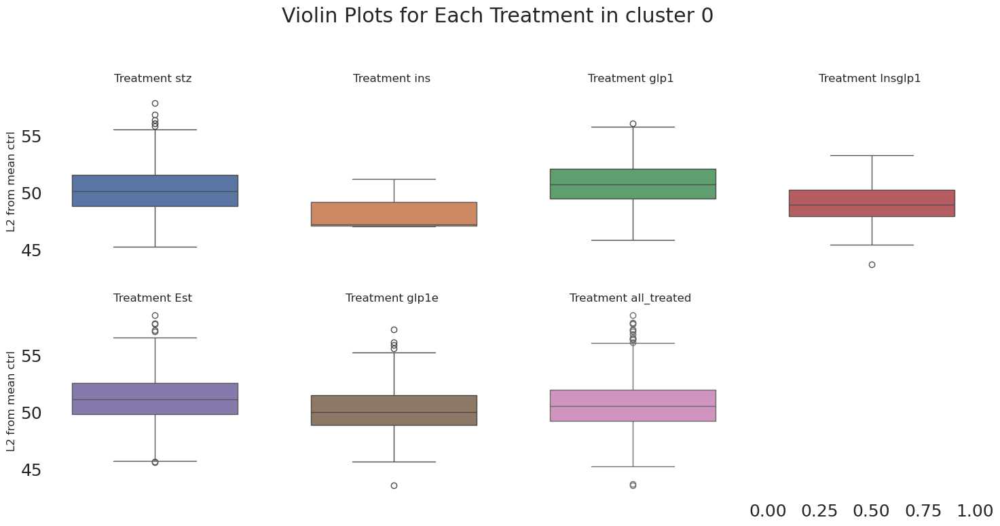

0 stz
1 ins
2 glp1
3 Insglp1
4 Est
5 glp1e
6 all_treated


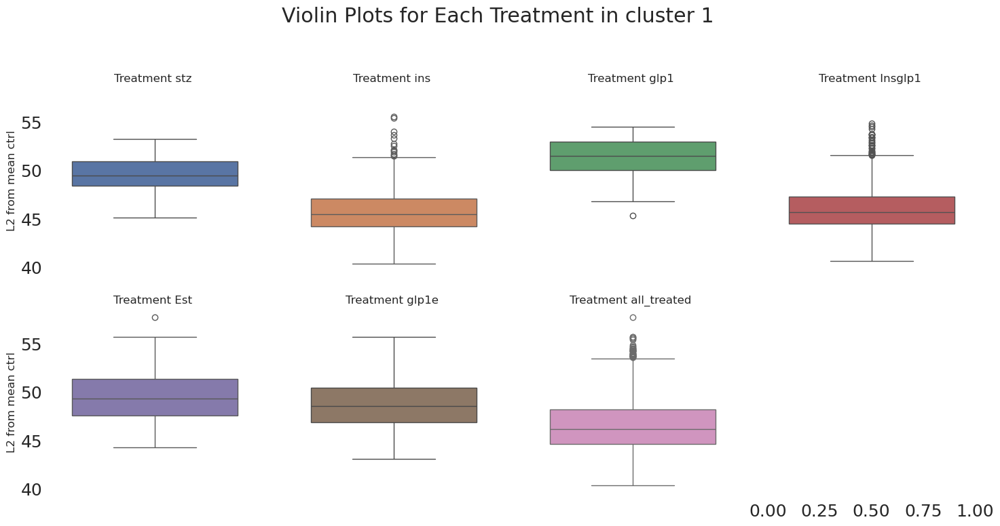

0 stz
1 ins
2 glp1
3 Insglp1
4 Est
5 glp1e
6 all_treated


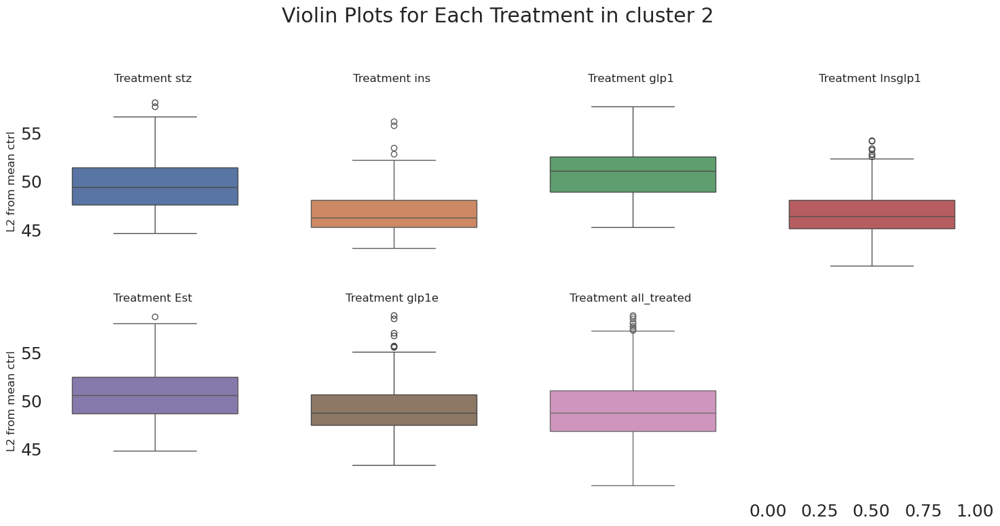

/tmp/ipykernel_3484516/824016104.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['seak','mid','healthy like','ctrl'])


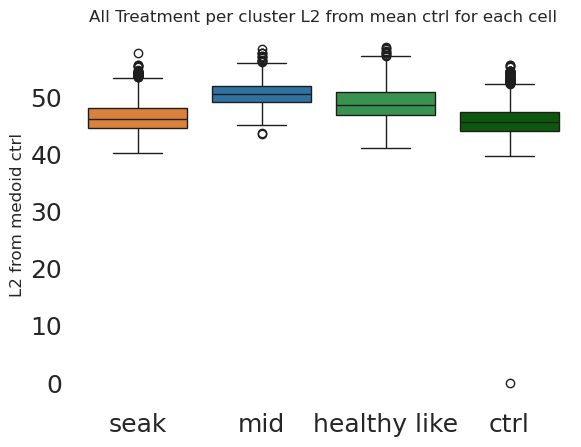

/tmp/ipykernel_3484516/824016104.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['seak','mid','healthy like','ctrl'])


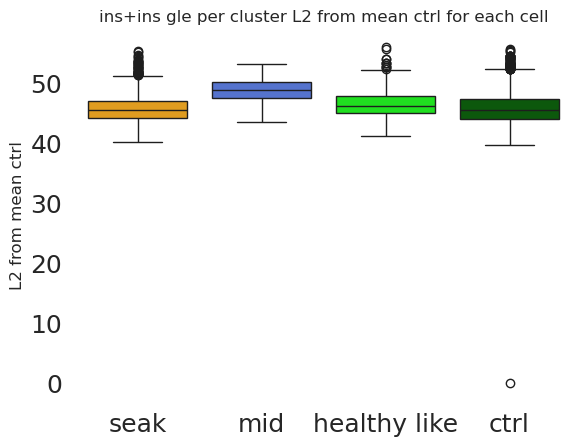

In [118]:

all_treated_per_cluster = []
all_treated_per_cluster_ins = []
ctrl_mean = np.mean(adata_beta_ctrl.X.toarray(), axis=0)
ctrl_mean = adata_beta_ctrl.X.toarray()[medoid_idx]
for cluster in ['0','1','2']:
    temp = adata_beta_stz_for_graph[adata_beta_stz_for_graph.obs["louvain"].isin([cluster])].copy()
    adata_beta_only_stz_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_STZ'])]
    adata_beta_only_ins_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_Ins'])]
    adata_beta_only_glp1_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_GLP1'])]
    adata_beta_only_Insglp1_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_InsGLP1'])]
    adata_beta_only_Est_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_Est'])]
    adata_beta_only_glp1e_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_GLP1E'])]

    adata_beta_all_ins = temp[temp.obs['groups_named_broad_cond'].isin(['beta_Ins','beta_InsGLP1'])]

    adata_beta_only_all_treated_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]
    test_stz = np.linalg.norm(adata_beta_only_stz_temp.X.toarray() - ctrl_mean, axis=1)
    #
    test_ins = np.linalg.norm(adata_beta_only_ins_temp.X.toarray() - ctrl_mean, axis=1)
    test_glp1 = np.linalg.norm(adata_beta_only_glp1_temp.X.toarray() - ctrl_mean, axis=1)
    test_Insglp1 = np.linalg.norm(adata_beta_only_Insglp1_temp.X.toarray() - ctrl_mean, axis=1)
    test_Est = np.linalg.norm(adata_beta_only_Est_temp.X.toarray() - ctrl_mean, axis=1)
    test_glp1e = np.linalg.norm(adata_beta_only_glp1e_temp.X.toarray() - ctrl_mean, axis=1)
    test_all_treated = np.linalg.norm(adata_beta_only_all_treated_temp.X.toarray() - ctrl_mean, axis=1)
    all_treated_per_cluster.append(test_all_treated)
    arrays = [test_stz,test_ins,test_glp1,test_Insglp1,test_Est,test_glp1e,test_all_treated]
    all_ins_temp = np.linalg.norm(adata_beta_all_ins.X.toarray() - ctrl_mean, axis=1)
    all_treated_per_cluster_ins.append(all_ins_temp)
    names = ['stz', 'ins', 'glp1', 'Insglp1', 'Est', 'glp1e', 'all_treated']

    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), sharey=True)
    fig.suptitle(f'Violin Plots for Each Treatment in cluster {cluster}')


    colors =['orange','blue','lime','darkgreen']
    for i, (array, ax) in enumerate(zip(arrays, axes.flatten()), 0):
        print(i,names[i])


        sns.boxplot(y=array, ax=ax, color=f'C{i}')

        ax.set_title(f'Treatment {names[i]} ')
        ax.set_ylabel('L2 from mean ctrl')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    plt.show()

colors_dict = {
    'green': '#2AA148',
    'blue': '#1D77B5',
    'orange': '#F57E20'
}
# costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green']]
costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green'],'darkgreen']
test_ctrl = np.linalg.norm(adata_beta_ctrl.X.toarray() - ctrl_mean, axis=1)
to_plot = [all_treated_per_cluster[1],all_treated_per_cluster[0],all_treated_per_cluster[2],test_ctrl]
ax = sns.boxplot(data=to_plot,palette=costum_colors)
ax.set_title('All Treatment per cluster L2 from mean ctrl for each cell')
ax.set_xticklabels(['seak','mid','healthy like','ctrl'])
ax.set_ylabel('L2 from medoid ctrl')
plt.yticks([0,10,20,30, 40, 50])
plt.savefig('temp.png', dpi=600, bbox_inches='tight')
# plt.savefig('figures/e_v4.svg', format='svg', dpi=600)
plt.show()
to_plot =[all_treated_per_cluster_ins[1],all_treated_per_cluster_ins[0],all_treated_per_cluster_ins[2],test_ctrl]
ax = sns.boxplot(data=to_plot,palette=['orange','royalblue','lime','darkgreen'])
ax.set_title('ins+ins gle per cluster L2 from mean ctrl for each cell')
ax.set_xticklabels(['seak','mid','healthy like','ctrl'])
ax.set_ylabel('L2 from mean ctrl')

#save fig

plt.show()


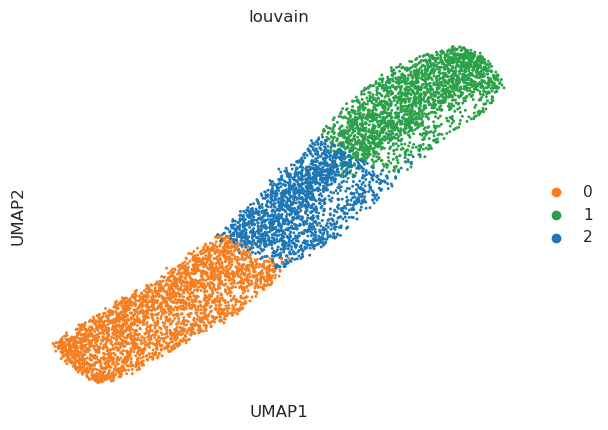

/tmp/ipykernel_3484516/2301653620.py:3: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
/tmp/ipykernel_3484516/2301653620.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
/tmp/ipykernel_3484516/2301653620.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, 

12414
['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2', 'Slc30a8', 'Ucn3', 'Aldh1a3', 'Serpina7', 'Gcg', 'Sst', 'Pyy']


/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


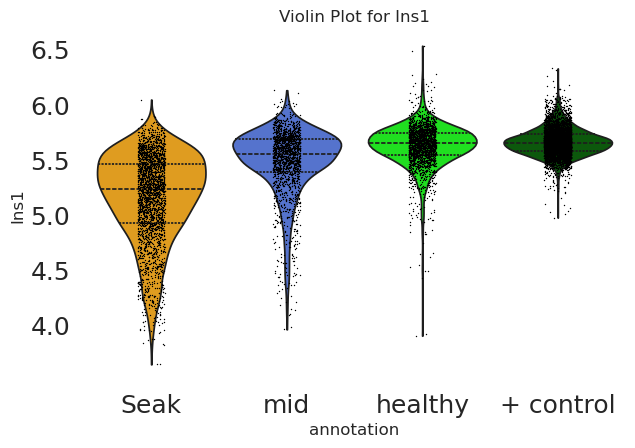

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


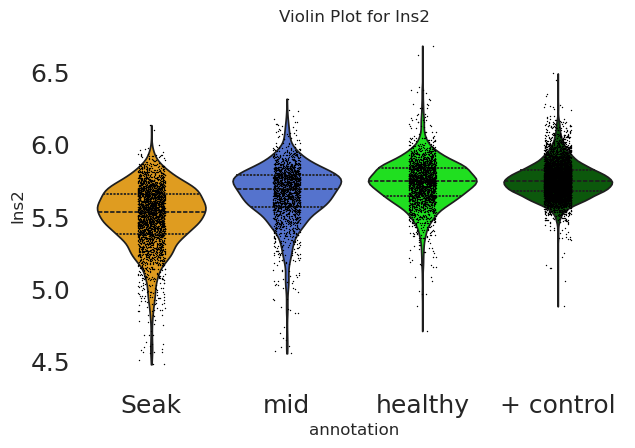

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


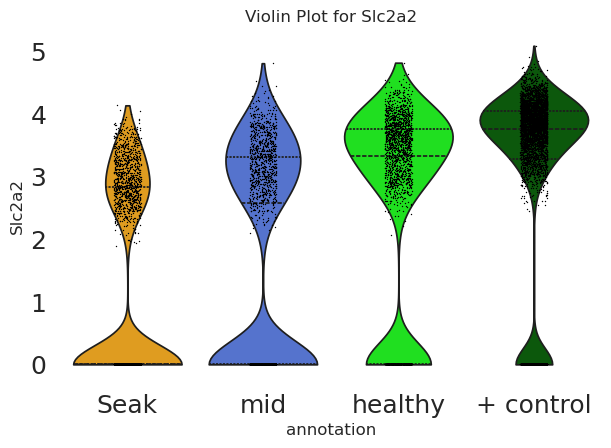

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


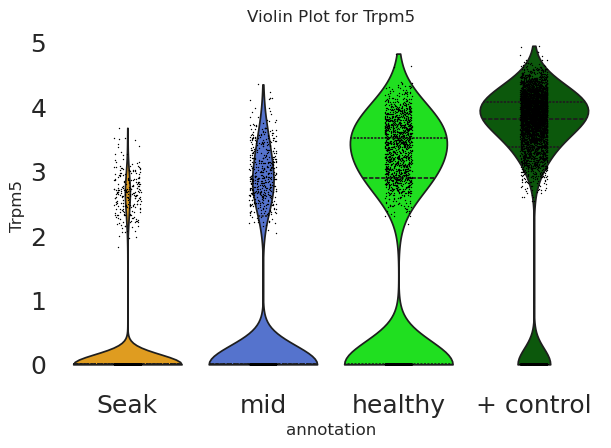

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


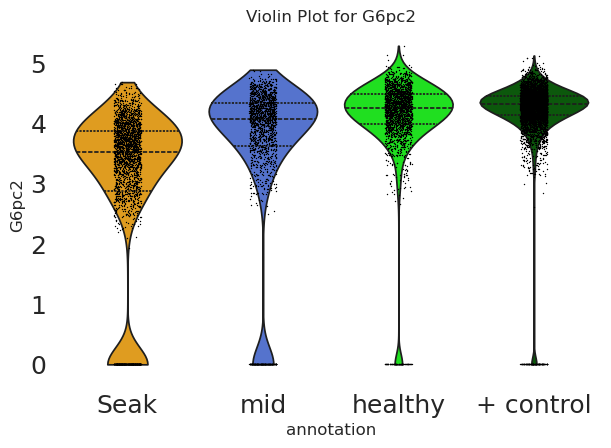

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


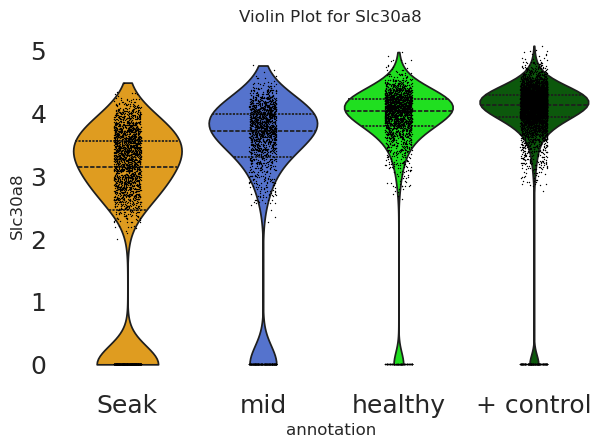

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


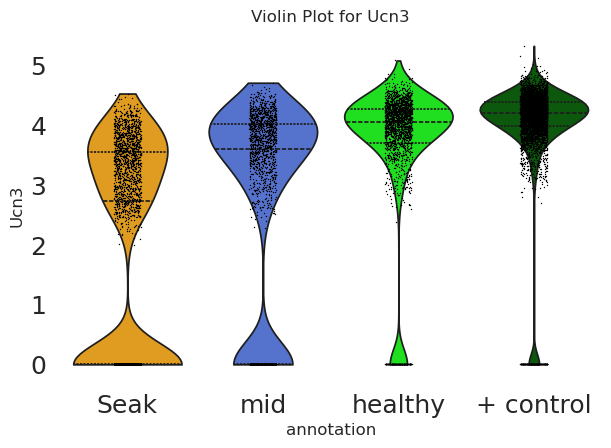

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


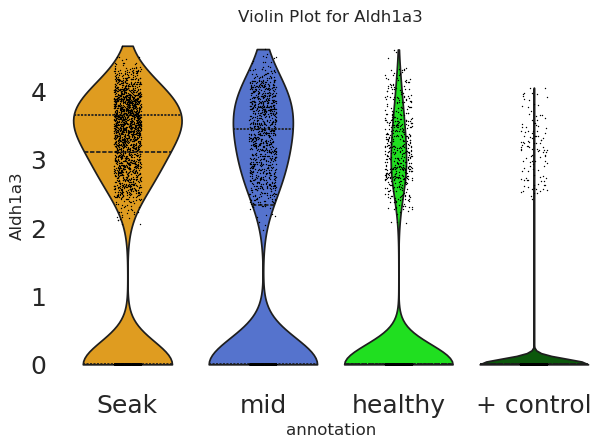

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


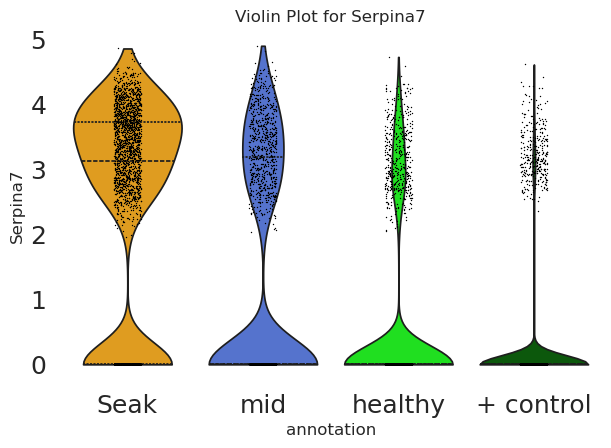

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


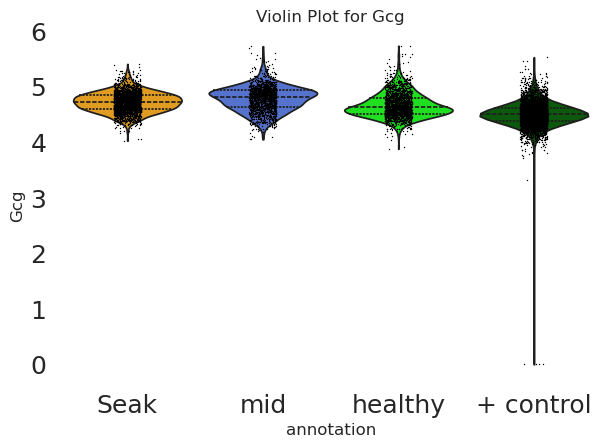

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


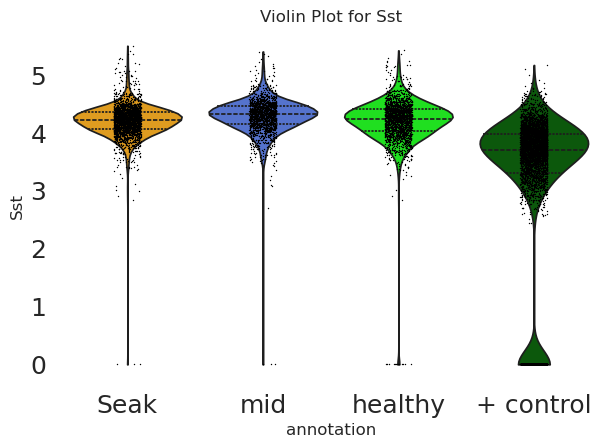

/cs/labs/ravehb/reshem/miniconda3/envs/py39dn4/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


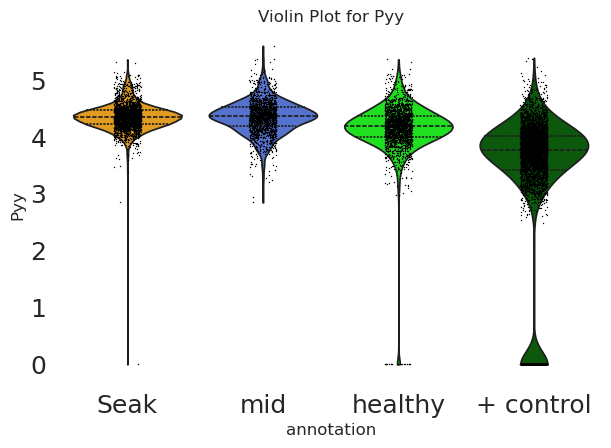

In [119]:
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()
sc.pl.umap(temp_adata_beta_stz_for_graph_scaled_with_ctrl,color=['louvain'])
temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
for i in range(temp.n_obs):
    if temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('+ control')
    elif temp.obs['louvain'][i]=='0':
        corr_classified_list.append("Seak")
    elif temp.obs['louvain'][i]=='2':
        corr_classified_list.append("mid")
    elif temp.obs['louvain'][i]=='1':
        corr_classified_list.append("healthy")
    else:
        print(temp.obs['louvain'][i])
print(len(corr_classified_list))
temp.obs['annotation']=corr_classified_list

genes = sum(list(beta_cells_genes_dict.values()), [])+['Gcg','Sst','Pyy']
print(genes)

for gene in genes:
    sc.pl.violin(temp, gene, groupby='annotation', cmap='BrBG', show=False, order=['Seak','mid','healthy','+ control'],palette = ['orange','royalblue','lime','darkgreen'],inner='quartile')
    plt.title(f'Violin Plot for {gene}')
    plt.savefig(f'figures/violin_plot_{gene}_e_f.png',dpi=900)
    # plt.savefig(f'figures/c_v3_sup.png',dpi=600)







    plt.show()





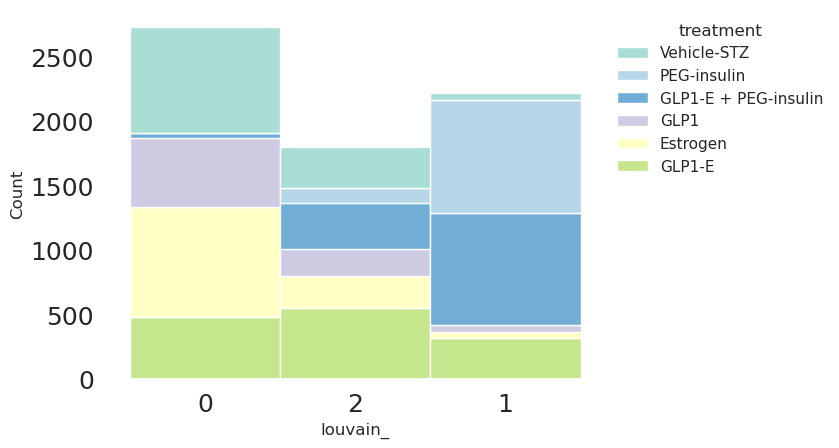

treatment  Estrogen  GLP1  GLP1-E  GLP1-E + PEG-insulin  PEG-insulin  \
louvain_                                                               
0               852   536     482                    38            3   
2               253   210     550                   350          122   
1                50    52     316                   868          878   

treatment  Vehicle-STZ  
louvain_                
0                  821  
2                  315  
1                   54  
Louvain Cluster 0:
  Estrogen: 31.19%
  GLP1: 19.62%
  GLP1-E: 17.64%
  GLP1-E + PEG-insulin: 1.39%
  PEG-insulin: 0.11%
  Vehicle-STZ: 30.05%
Louvain Cluster 2:
  Estrogen: 14.06%
  GLP1: 11.67%
  GLP1-E: 30.56%
  GLP1-E + PEG-insulin: 19.44%
  PEG-insulin: 6.78%
  Vehicle-STZ: 17.50%
Louvain Cluster 1:
  Estrogen: 2.25%
  GLP1: 2.34%
  GLP1-E: 14.25%
  GLP1-E + PEG-insulin: 39.13%
  PEG-insulin: 39.59%
  Vehicle-STZ: 2.43%


/tmp/ipykernel_3484516/4068768685.py:57: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result_df = df.groupby(['louvain_', 'treatment']).size().unstack(fill_value=0)


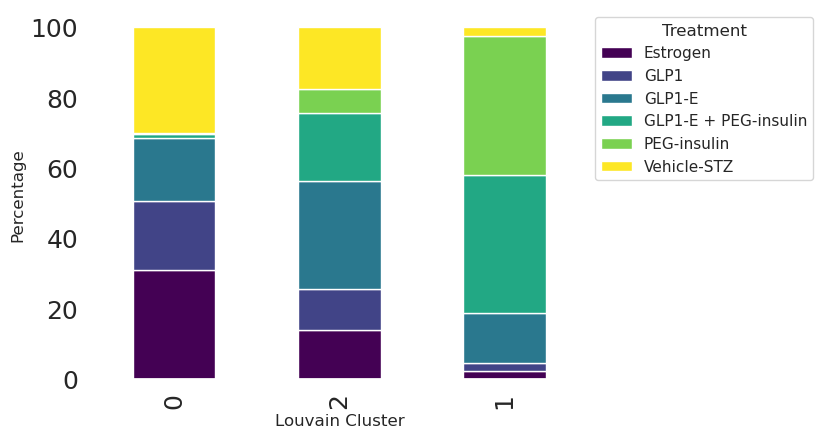

/tmp/ipykernel_3484516/4068768685.py:81: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result_df = df.groupby(['louvain_', 'treatment']).size().unstack(fill_value=0)


treatment  Estrogen  GLP1  GLP1-E  GLP1-E + PEG-insulin  PEG-insulin  \
louvain_                                                               
0               852   536     482                    38            3   
2               253   210     550                   350          122   
1                50    52     316                   868          878   

treatment  Vehicle-STZ  
louvain_                
0                  821  
2                  315  
1                   54  
treatment  Estrogen  GLP1  GLP1-E  GLP1-E + PEG-insulin  PEG-insulin  \
louvain_                                                               
0               852   536     482                    38            3   
2               253   210     550                   350          122   
1                50    52     316                   868          878   

treatment  Vehicle-STZ  
louvain_                
0                  821  
2                  315  
1                   54  
treatment   Estrogen       G

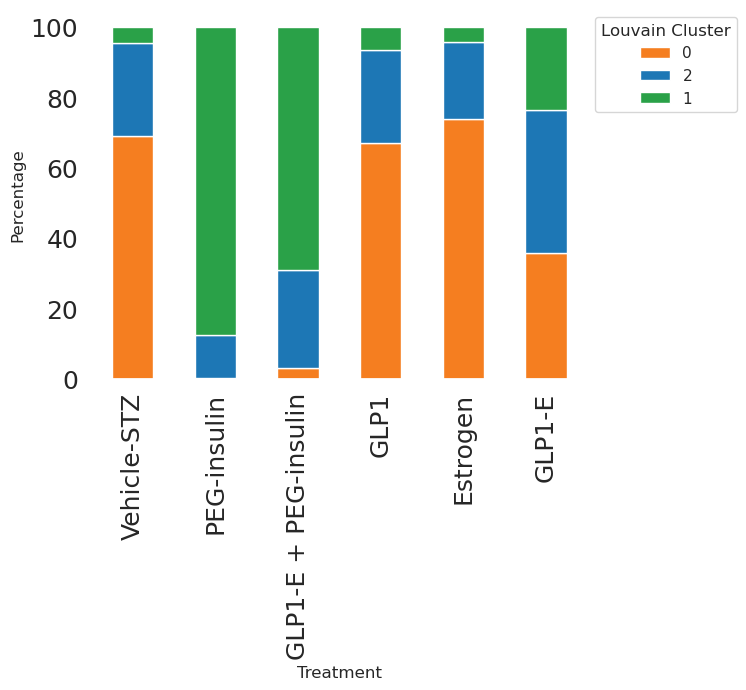

In [120]:
adata_beta_stz_for_graph_scaled_temp = adata_beta_stz_for_graph_scaled.copy()
df = adata_beta_stz_for_graph_scaled_temp.obs
df["louvain_"] =  pd.Categorical(df['louvain'], ['0','2','1'])

color_dict = {
    "color1": "#8dd3c7",
    "color2": "#ffffb3",
    "color3": "#bebada",
    "color4": "#fb8072",
    "color5": "#80b1d3",
    "color6": "#fdb462",
    "color7": "#b3de69",
    "color8": "#fccde5",
    "color9": "#4292c6",
    "color10": "#9ecae1"
}
hue_order = ['Vehicle-STZ', 'PEG-insulin', 'GLP1-E + PEG-insulin','GLP1',
                       'Estrogen','GLP1-E']
#
# ax = sns.histplot(data=df, x="louvain_", hue="treatment", multiple="stack",palette=[color_dict["color1"],color_dict["color2"],color_dict["color3"],color_dict["color4"],color_dict["color6"],color_dict["color7"]],bins=20)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.show()

ax = sns.histplot(data=df, x="louvain_", hue="treatment", multiple="stack",palette=[color_dict["color1"],color_dict["color10"],color_dict["color9"],color_dict["color3"],color_dict["color2"],color_dict["color7"]],hue_order=hue_order)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# plt.legend(frameon=False)
leg = ax.get_legend()
leg.set_frame_on(False)
plt.savefig('figures/g_v3.png', dpi=600, bbox_inches='tight')
plt.savefig('figures/g_v3.svg', format='svg', dpi=600)
plt.show()

# # df["louvain_"] =  pd.Categorical(df['louvain'], ['1','0','2'])
# # hue_order = ['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E']
# hue_order = ['Vehicle-STZ', 'PEG-insulin', 'GLP1-E + PEG-insulin','GLP1',
#                        'Estrogen','GLP1-E']
# ax = sns.histplot(data=df, x="louvain", hue="treatment", multiple="stack",palette=[color_dict["color1"],color_dict["color2"],color_dict["color3"],color_dict["color9"],color_dict["color10"],color_dict["color7"]],hue_order=hue_order)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# # plt.legend(frameon=False)
# leg = ax.get_legend()
# leg.set_frame_on(False)
# plt.savefig('figures/g_v4.png', dpi=600, bbox_inches='tight')
# plt.savefig('figures/g_v4.svg', format='svg', dpi=600)
# plt.show()





# plt.savefig('figures/k.png', dpi=600, bbox_inches='tight')
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# count_nmber
# ax = sns.barplot(data=adata_beta_stz_for_graph_scaled.obs, x="louvain", y="conf", hue="treatment",order=["1","0", "2"])
# Calculate and display the fractions as text annotations
# Calculate the fraction of each treatment in each louvain cluster
# Calculate the fraction of each treatment in each louvain cluster
result_df = df.groupby(['louvain_', 'treatment']).size().unstack(fill_value=0)
print(result_df)
result_df = result_df.div(result_df.sum(axis=1), axis=0) * 100

# Plot the fractions as a bar plot
ax = result_df.plot(kind='bar', stacked=True, colormap='viridis', edgecolor='white')

# Add legend and labels
ax.legend(title='Treatment', bbox_to_anchor=(1, 1))
ax.set_xlabel('Louvain Cluster')
ax.set_ylabel('Percentage')

# Print the percentages for each treatment and each louvain cluster
for index, row in result_df.iterrows():
    print(f"Louvain Cluster {index}:")
    for treatment, percentage in row.items():
        print(f"  {treatment}: {percentage:.2f}%")

# Show the plot

plt.show()


# Calculate the fraction of each treatment in each louvain cluster
result_df = df.groupby(['louvain_', 'treatment']).size().unstack(fill_value=0)
# result_df = df.groupby(['louvain', 'treatment']).size().unstack(fill_value=0)
print(result_df)
print(result_df)
result_df = result_df.div(result_df.sum(axis=0), axis=1) * 100
print(result_df)

# # Normalize percentages within each treatment group to sum to 100
# result_df = result_df.div(result_df.sum(axis=0), axis=1) * 100
# print(result_df)
#
#change the order of the columns
result_df = result_df[['Vehicle-STZ', 'PEG-insulin', 'GLP1-E + PEG-insulin','GLP1',
                       'Estrogen','GLP1-E']]  # Replace with desired column order
#
# print(result_df)


# Set custom colors
# custom_colors = ['orange', 'lightblue', 'lightgreen']
# custom_colors = ['orange', 'royalblue','lime']
colors_dict = {
    'green': '#2AA148',
    'blue': '#1D77B5',
    'orange': '#F57E20'
}
costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green']]
#make the fig bigger
# plt.figure(figsize=(20, 12))
# Plot the fractions as a bar plot with custom colors
ax = result_df.T.plot(kind='bar', stacked=True, color=costum_colors, edgecolor='white')

# Add legend and labels
ax.legend(title='Louvain Cluster', bbox_to_anchor=(1, 1))
ax.set_xlabel('Treatment')
ax.set_ylabel('Percentage')

# Print the percentages for each louvain cluster and each treatment
for column, values in result_df.items():
    print(f"Louvain Cluster {column}:")
    for treatment, percentage in values.items():
        print(f"  {treatment}: {percentage:.2f}%")
plt.savefig('figures/k_v2.png', dpi=600, bbox_inches='tight')
plt.savefig('figures/k_v2.svg', format='svg', dpi=600)
plt.show()
# print(result_df)

/tmp/ipykernel_3484516/2644343905.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result_df = df.groupby(['louvain_', 'treatment']).size().unstack(fill_value=0)


Louvain Cluster Estrogen:
  0: 31.19%
  2: 14.06%
  1: 2.25%
Louvain Cluster GLP1:
  0: 19.62%
  2: 11.67%
  1: 2.34%
Louvain Cluster GLP1-E:
  0: 17.64%
  2: 30.56%
  1: 14.25%
Louvain Cluster GLP1-E + PEG-insulin:
  0: 1.39%
  2: 19.44%
  1: 39.13%
Louvain Cluster PEG-insulin:
  0: 0.11%
  2: 6.78%
  1: 39.59%
Louvain Cluster Vehicle-STZ:
  0: 30.05%
  2: 17.50%
  1: 2.43%


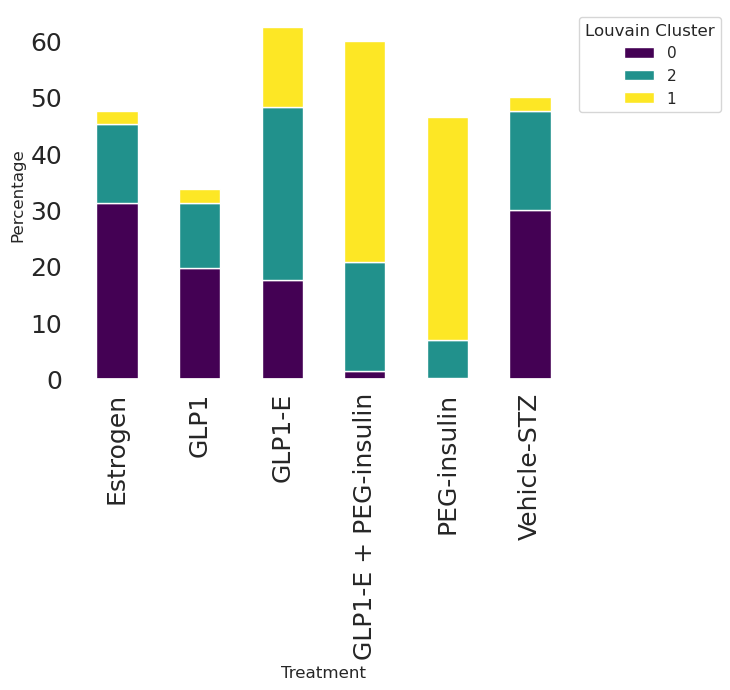

In [121]:
result_df = df.groupby(['louvain_', 'treatment']).size().unstack(fill_value=0)
result_df = result_df.div(result_df.sum(axis=1), axis=0) * 100

# Plot the fractions
# as a bar plot
ax = result_df.T.plot(kind='bar', stacked=True, colormap='viridis', edgecolor='white')

# Add legend and labels
ax.legend(title='Louvain Cluster', bbox_to_anchor=(1, 1))
ax.set_xlabel('Treatment')
ax.set_ylabel('Percentage')

# Print the percentages for each louvain cluster and each treatment
for column, values in result_df.items():
    print(f"Louvain Cluster {column}:")
    for treatment, percentage in values.items():
        print(f"  {treatment}: {percentage:.2f}%")

# Show the plot
plt.show()

In [ ]:
# # Calculate the fraction of each treatment in each louvain cluster
# result_df = df.groupby(['louvain_', 'treatment']).size().unstack(fill_value=0)
# result_df = result_df.div(result_df.sum(axis=1), axis=0) * 100
# print(result_df)
# # Normalize percentages within each treatment group to sum to 100
# result_df = result_df.div(result_df.sum(axis=0), axis=1) * 100
#
# #change the order of the columns
# result_df = result_df[['Vehicle-STZ', 'PEG-insulin', 'GLP1-E + PEG-insulin','GLP1',
#                        'Estrogen','GLP1-E']]  # Replace with desired column order
#
#
#
# # Set custom colors
# # custom_colors = ['orange', 'lightblue', 'lightgreen']
# # custom_colors = ['orange', 'royalblue','lime']
# colors_dict = {
#     'green': '#2AA148',
#     'blue': '#1D77B5',
#     'orange': '#F57E20'
# }
# costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green']]
# #make the fig bigger
# # plt.figure(figsize=(20, 12))
# # Plot the fractions as a bar plot with custom colors
# ax = result_df.T.plot(kind='bar', stacked=True, color=costum_colors, edgecolor='white')
#
# # Add legend and labels
# ax.legend(title='Louvain Cluster', bbox_to_anchor=(1, 1))
# ax.set_xlabel('Treatment')
# ax.set_ylabel('Percentage')
#
# # Print the percentages for each louvain cluster and each treatment
# for column, values in result_df.items():
#     print(f"Louvain Cluster {column}:")
#     for treatment, percentage in values.items():
#         print(f"  {treatment}: {percentage:.2f}%")
#
# #save fig as svm file
#
# # Show the plot
# plt.show()

In [123]:
adata_beta_ctrl = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_Ctrl'])]


/tmp/ipykernel_3484516/1489443853.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if adata_beta_stz_temp.obs['groups_named_broad_cond'][i]=='beta_Ins' or adata_beta_stz_temp.obs['groups_named_broad_cond'][i]=='beta_InsGLP1':


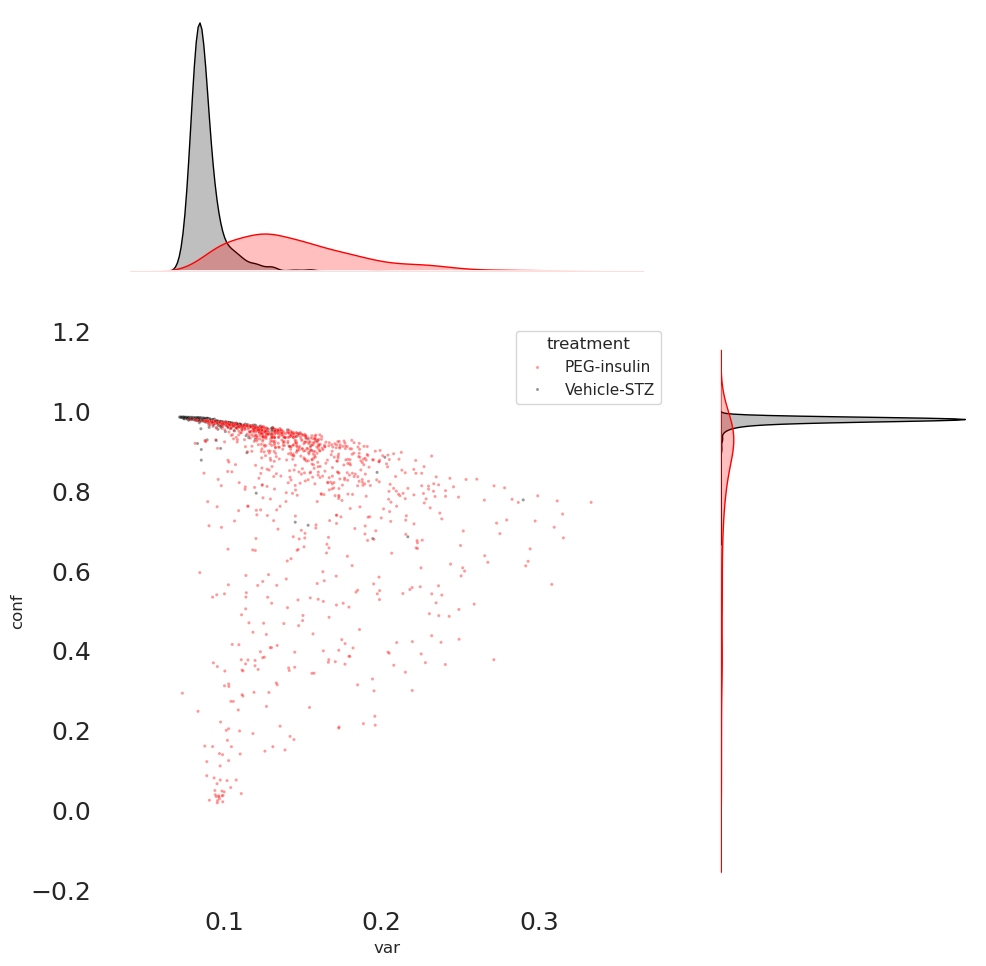

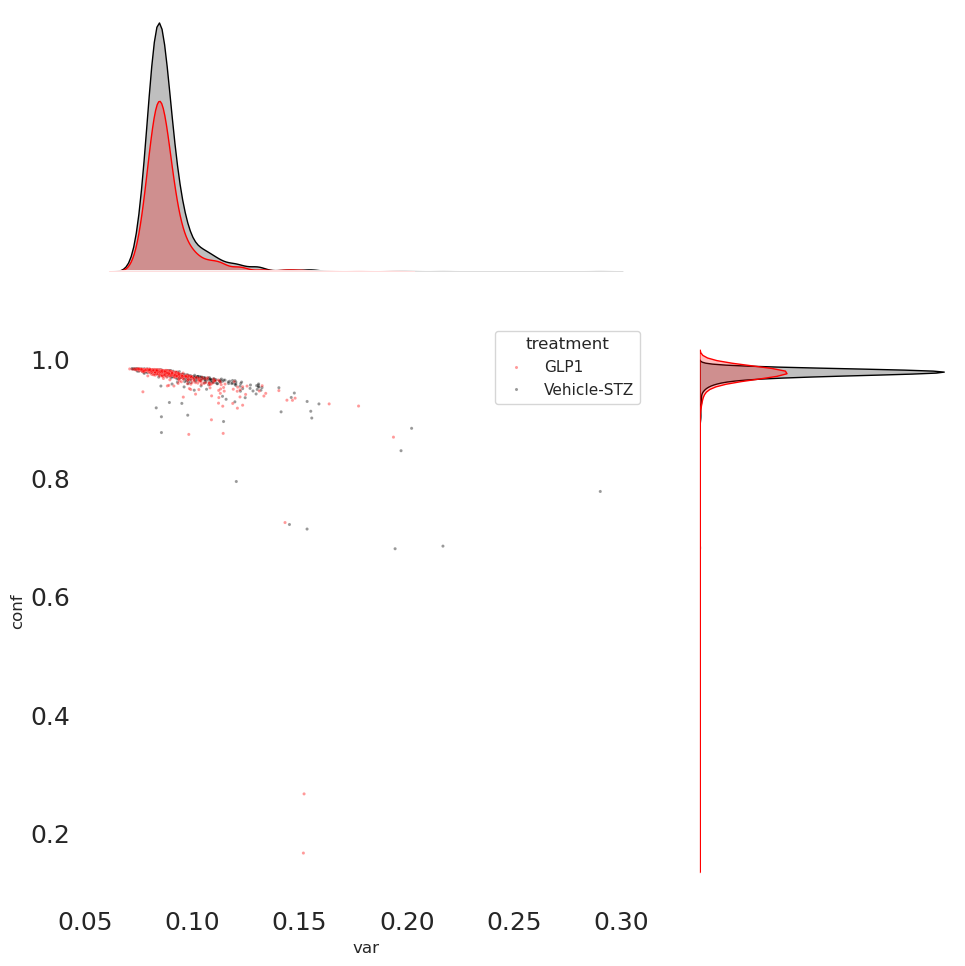

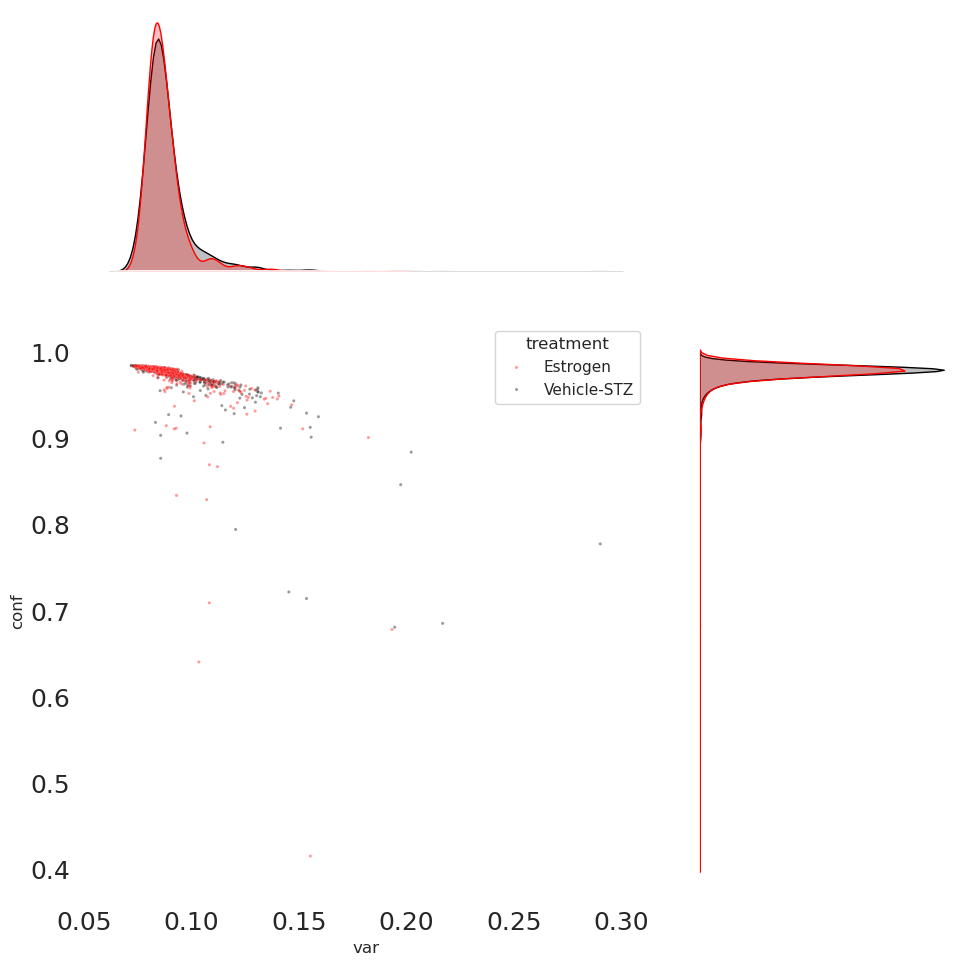

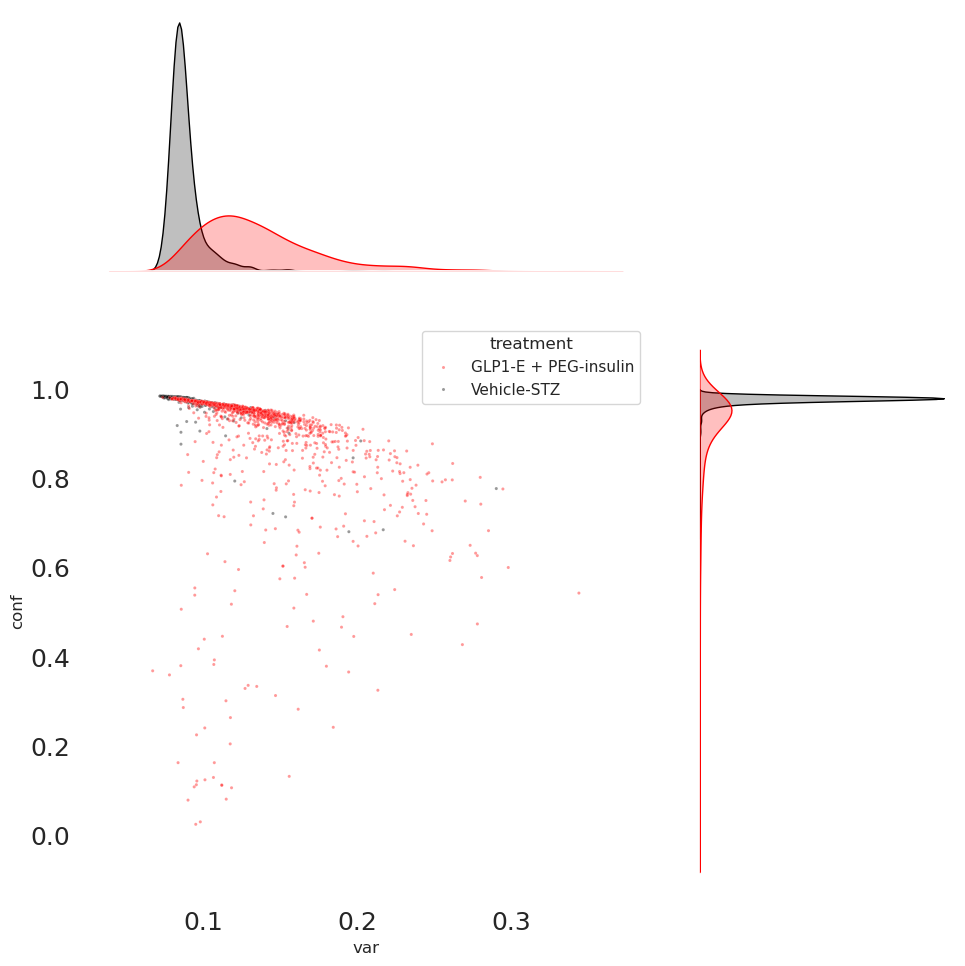

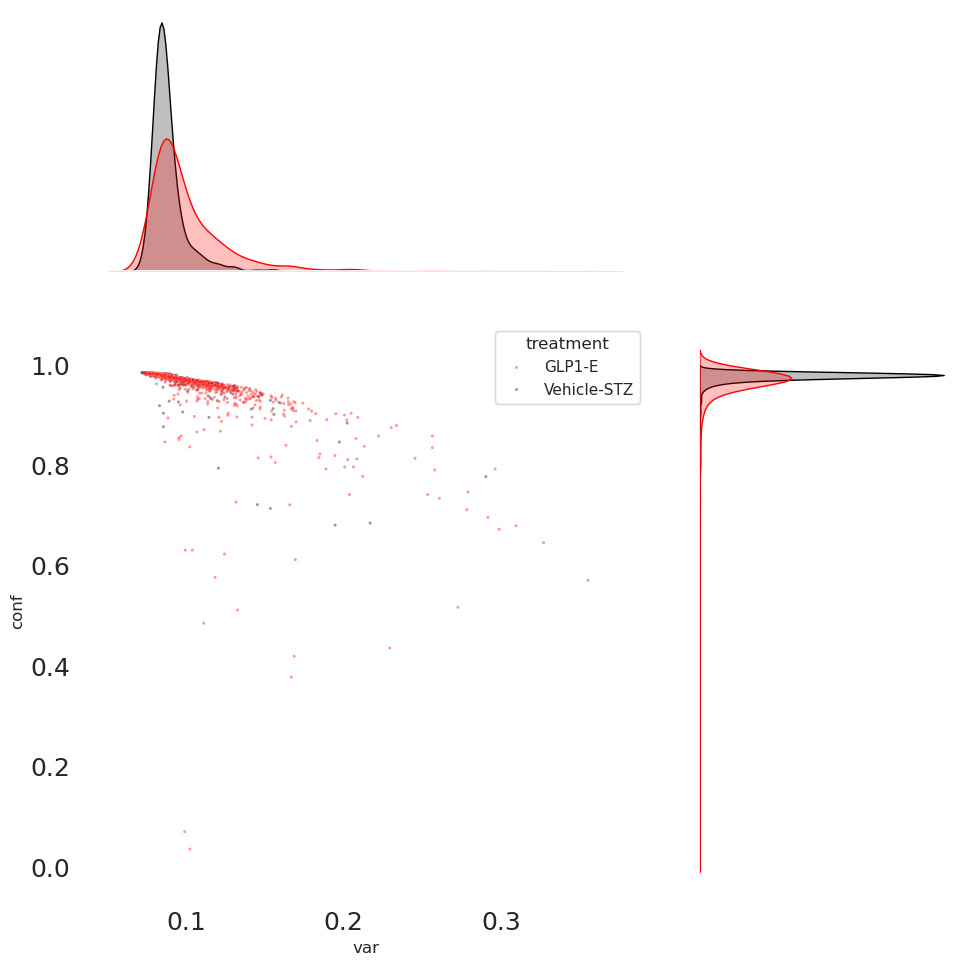

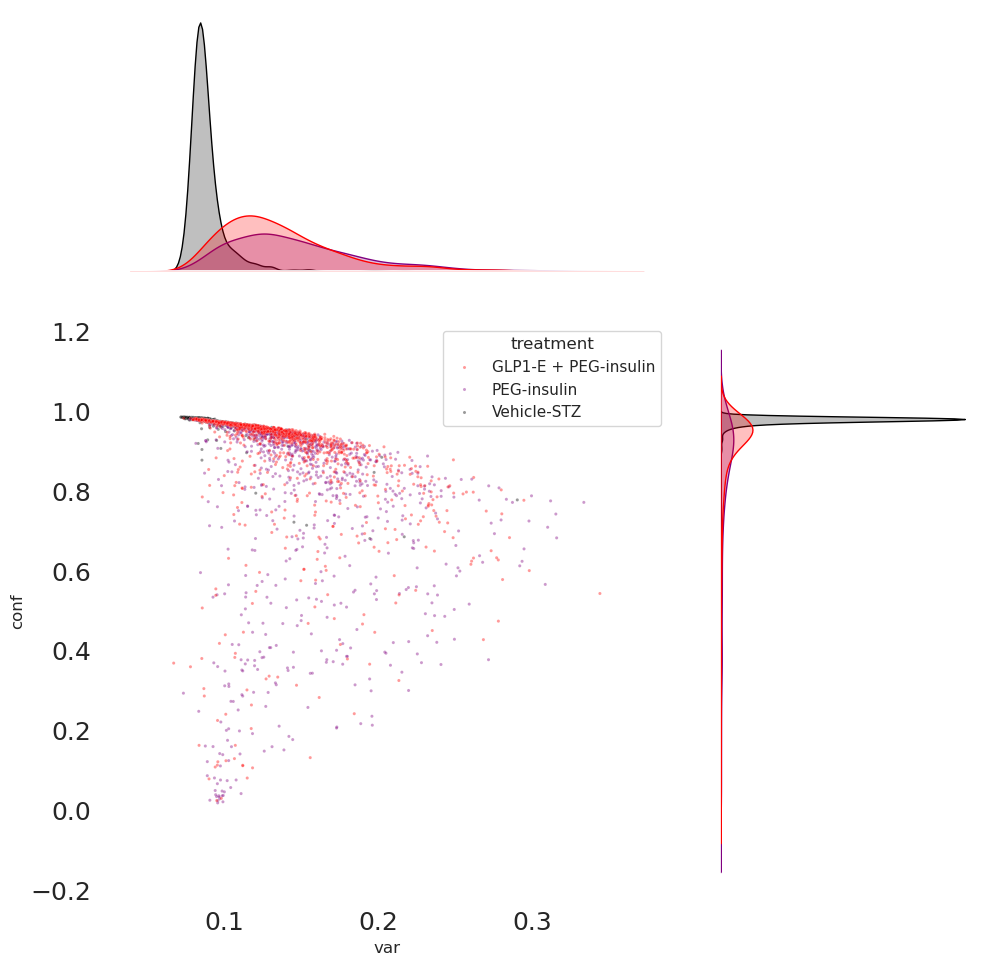

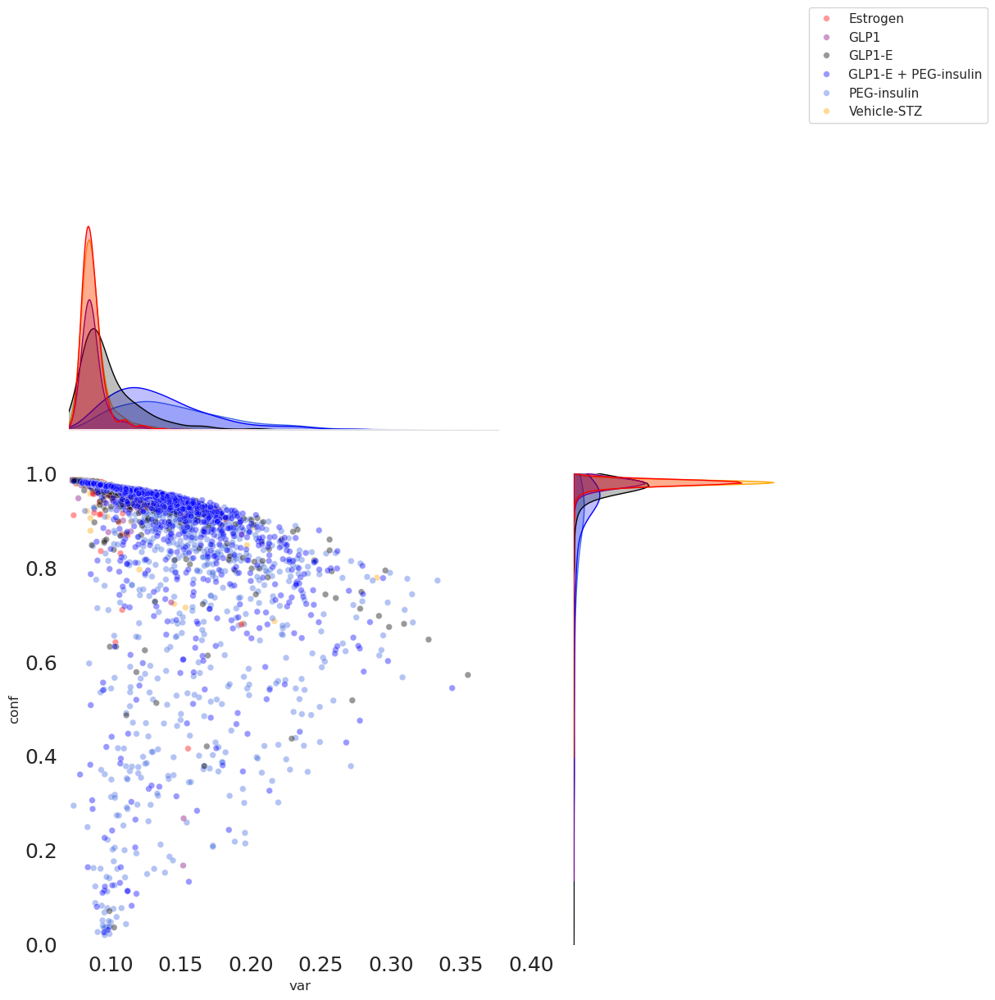

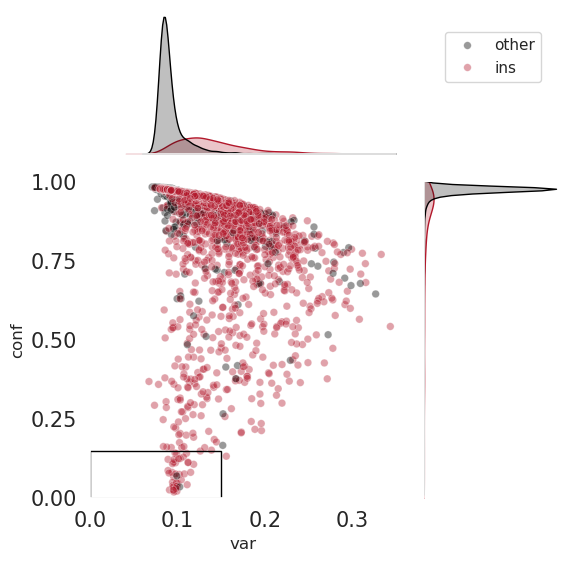

In [124]:
#adata_beta_stz_ins = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_GLP1','beta_Ins','beta_InsGLP1','beta_Est','beta_GLP1E'])]
# sns.set(style="whitegrid")  # Optional: Set the style of the plot
#
# # Adjust the figure size to fit a small panel
# plt.figure(figsize=(6, 4))

# Create the joint plot with specified parameters


adata_beta_stz_ins = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins'])]
adata_beta_stz_glp = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_GLP1'])]
adata_beta_stz_est = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Est'])]
adata_beta_stz_insglp = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_InsGLP1'])]
adata_beta_stz_glpe = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_GLP1E'])]


adata_beta_stz_ins_all = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_InsGLP1'])]

adata_beta_stz_all = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E'])]

# ,palette=['orange','blue','lime','darkgreen']

sns.jointplot(data=adata_beta_stz_ins.obs, x="var", y="conf", hue='treatment',height=10, alpha=0.4, s=5, ratio=2,palette=['red','black'])
# plt.savefig(f'figures/i_ins.png',dpi=600)
sns.jointplot(data=adata_beta_stz_glp.obs, x="var", y="conf", hue='treatment',height=10, alpha=0.4, s=5, ratio=2,palette=['red','black'])
# plt.savefig(f'figures/i_glp.png',dpi=600)
sns.jointplot(data=adata_beta_stz_est.obs, x="var", y="conf", hue='treatment',height=10, alpha=0.4, s=5, ratio=2,palette=['red','black'])
# plt.savefig(f'figures/i_est.png',dpi=600)
sns.jointplot(data=adata_beta_stz_insglp.obs, x="var", y="conf", hue='treatment',height=10, alpha=0.4, s=5, ratio=2,palette=['red','black'])
# plt.savefig(f'figures/i_insglp.png',dpi=600)
sns.jointplot(data=adata_beta_stz_glpe.obs, x="var", y="conf", hue='treatment',height=10, alpha=0.4, s=5, ratio=2,palette=['red','black'])
# plt.savefig(f'figures/i_glpe.png',dpi=600)
sns.jointplot(data=adata_beta_stz_ins_all.obs, x="var", y="conf", hue='treatment',height=10, alpha=0.4, s=5, ratio=2,palette=['red','purple','black'])
# plt.savefig(f'figures/i_ins_all.png',dpi=600)

sns.jointplot(data=adata_beta_stz_all.obs, x="var", y="conf", hue='treatment',height=10, alpha=0.4, s=30, ratio=2,palette=['red','purple','black','blue','royalblue','orange'])
#move the legend
plt.legend(loc='upper right', bbox_to_anchor=(2, 2))
plt.ylim(0, 1)
plt.xlim(0.07, 0.4)



adata_beta_stz_temp = adata_stz[adata_stz.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])].copy()




corr_classified_list = []
# temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(adata_beta_stz_temp.n_obs):
    if adata_beta_stz_temp.obs['groups_named_broad_cond'][i]=='beta_Ins' or adata_beta_stz_temp.obs['groups_named_broad_cond'][i]=='beta_InsGLP1':
        corr_classified_list.append('ins')
    else:
        corr_classified_list.append('other')
adata_beta_stz_temp.obs['annotation']=corr_classified_list


# plt.figure(figsize=(5, 4))
joint_plot=sns.jointplot(data=adata_beta_stz_temp.obs, x="var", y="conf", hue='annotation',height=6, alpha=0.4, s=30, ratio=2,palette=['black','#b2182b'])
#move the legend
plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1.5))
plt.ylim(0, 1)
plt.xlim(0.00, 0.35)
#show less ticks
# joint_plot.ax_joint.xaxis.set_major_locator(plt.MaxNLocator(5))
# joint_plot.ax_joint.yaxis.set_major_locator(plt.MaxNLocator(5))

plt.xticks(ticks=[0, 0.1, 0.2,0.3])
plt.yticks(ticks=[0, 0.25, 0.5,0.75,1])
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
# Create a rectangle patch
import matplotlib.patches as patches
rect = patches.Rectangle((0, 0), 0.15, 0.15, linewidth=1, edgecolor='black', facecolor='none')

# Add the rectangle patch to the axis
joint_plot.ax_joint.add_patch(rect)

# Show the plot
plt.savefig('figures/i_v3.png', dpi=600, bbox_inches='tight')
plt.savefig('figures/i_v3.svg', format='svg', dpi=600)

# Set the style to white background
# sns.set_style("white")



# # Create the joint plot with specified parameters
# sns.jointplot(
#     data=adata_beta_stz_temp.obs,
#     x="var",
#     y="conf",
#     hue='annotation',
#     height=6,  # Adjust the height to fit the small panel
#     alpha=0.4,
#     s=10,
#     ratio=2,
#     palette=['black', '#b2182b']
# )
#
# # Adjust the x and y tick parameters for larger ticks
# plt.xticks(fontsize=10)
# plt.yticks(fontsize=10)
#
# # Show the plot
# # plt.savefig('figures/i_v3.png', dpi=600, bbox_inches='tight')
plt.show()


In [ ]:
# naive scanpy gragh  
temp_naive = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])].copy()
sc.pp.pca(temp_naive)
sc.pp.neighbors(temp_naive)
sc.tl.umap(temp_naive)
# temp_naive = adata_beta_stz_for_graph.copy()
sc.tl.louvain(temp_naive, resolution=0.3)
sc.tl.rank_genes_groups(temp_naive, 'louvain' ,method='wilcoxon')
sc.pl.rank_genes_groups(temp_naive, n_genes=25, sharey=False)
sc.pl.umap(temp_naive,color=['louvain'])
sc.pl.umap(temp_naive,color=['conf'])
sc.pl.umap(temp_naive,color=['conf_position'])
sc.pl.umap(temp_naive,color=['var'])
sc.pl.umap(temp_naive,color=['Ins1'])
sc.pl.umap(temp_naive,color=['Serpina7'])
sc.pl.umap(temp_naive,color=['groups_named_broad_cond'])
# adata_beta_stz_for_graph_scaled = adata_beta_stz_for_graph.copy()


adata_beta_stz_for_graph_scaled = temp_naive.copy()
sc.pp.scale(adata_beta_stz_for_graph_scaled)
ax = sc.pl.matrixplot(adata_beta_stz_for_graph_scaled, beta_cells_genes_dict, groupby='louvain',cmap='BrBG')
ax = sc.pl.matrixplot(adata_beta_stz_for_graph_scaled, beta_cells_genes_dict, groupby='louvain',cmap='BrBG',vmin=-1.5,vmax=1.5)

ax = sc.pl.matrixplot(temp_naive, beta_cells_genes_dict, groupby='louvain',cmap='BrBG')

# Check the version of louvain
# louvain_version = getattr(louvain, '__version__', '0.9.0')
# print(f"Louvain version: {louvain_version}")
ax = sns.histplot(data=temp_naive.obs, x="louvain", hue="treatment", multiple="stack")
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


b_cells_activity = ['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2', 'Slc30a8', 'Ucn3']

print("sanc py")
for cluster_num in range(3):
    b_cells_activity_graph = []
    for i , j  in enumerate(temp_naive.uns['rank_genes_groups']['names']):
        if j[cluster_num] in b_cells_activity:
            print(cluster_num)
            print(temp_naive.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
            print("j",j[cluster_num])
            b_cells_activity_graph.append(temp_naive.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
    print("$$$$$$")

    print("Mean of embedded graph logfold change: " + str(np.mean(np.array(b_cells_activity_graph))))
dedef = ['Aldh1a3', 'Serpina7']
for cluster_num in range(3):
    b_cells_activity_graph = []
    for i , j  in enumerate(temp_naive.uns['rank_genes_groups']['names']):
        if j[cluster_num] in dedef:
            print(cluster_num)
            print(temp_naive.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
            print("j",j[cluster_num])
            b_cells_activity_graph.append(temp_naive.uns['rank_genes_groups']['logfoldchanges'][i][cluster_num])
    print("$$$$$$")

    print("Mean of embedded graph logfold change: " + str(np.mean(np.array(b_cells_activity_graph))))


In [ ]:
# # naive scanpy gragh
# temp_naive = adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])].copy()
# sc.pp.pca(temp_naive)
# sc.pp.neighbors(temp_naive)
# sc.tl.umap(temp_naive)
# # temp_naive = adata_beta_stz_for_graph.copy()
# sc.tl.louvain(temp_naive, resolution=0.3)
# Calculate the fraction of each treatment in each louvain cluster
# adata_beta_stz_for_graph_scaled_temp = temp_naive.copy()\
color_dict = {
    "color1": "#8dd3c7",
    "color2": "#ffffb3",
    "color3": "#bebada",
    "color4": "#fb8072",
    "color5": "#80b1d3",
    "color6": "#fdb462",
    "color7": "#b3de69",
    "color8": "#fccde5",
    "color9": "#4292c6",
    "color10": "#9ecae1"
}
df = temp_naive.obs
# df["louvain_"] =  pd.Categorical(df['louvain'], ['1','0','2'])
# hue_order = ['beta_STZ','beta_Ins','beta_InsGLP1','beta_GLP1','beta_Est','beta_GLP1E']
hue_order = ['Vehicle-STZ', 'PEG-insulin', 'GLP1-E + PEG-insulin','GLP1',
                       'Estrogen','GLP1-E']
ax = sns.histplot(data=df, x="louvain", hue="treatment", multiple="stack",palette=[color_dict["color1"],color_dict["color10"],color_dict["color9"],color_dict["color3"],color_dict["color2"],color_dict["color7"]],hue_order=hue_order)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# plt.legend(frameon=False)
leg = ax.get_legend()
leg.set_frame_on(False)
plt.savefig('figures/g_v4.png', dpi=900, bbox_inches='tight')
plt.savefig('figures/g_v4.svg', format='svg', dpi=600)
plt.show()

# Calculate the fraction of each treatment in each louvain cluster
result_df = df.groupby(['louvain', 'treatment']).size().unstack(fill_value=0)
print(result_df)
result_df = result_df.div(result_df.sum(axis=0), axis=1) * 100
print(result_df)

# # Normalize percentages within each treatment group to sum to 100
# result_df = result_df.div(result_df.sum(axis=0), axis=1) * 100
# print(result_df)
#
#change the order of the columns
result_df = result_df[['Vehicle-STZ', 'PEG-insulin', 'GLP1-E + PEG-insulin','GLP1',
                       'Estrogen','GLP1-E']]  # Replace with desired column order
#
# print(result_df)


# Set custom colors
# custom_colors = ['orange', 'lightblue', 'lightgreen']
# custom_colors = ['orange', 'royalblue','lime']
colors_dict = {
    'green': '#2AA148',
    'blue': '#1D77B5',
    'orange': '#F57E20'
}
costum_colors = [colors_dict['orange'],colors_dict['blue'],colors_dict['green']]
#make the fig bigger
# plt.figure(figsize=(20, 12))
# Plot the fractions as a bar plot with custom colors
ax = result_df.T.plot(kind='bar', stacked=True, color=costum_colors, edgecolor='white')

# Add legend and labels
ax.legend(title='Louvain Cluster', bbox_to_anchor=(1, 1))
ax.set_xlabel('Treatment')
ax.set_ylabel('Percentage')

# Print the percentages for each louvain cluster and each treatment
for column, values in result_df.items():
    print(f"Louvain Cluster {column}:")
    for treatment, percentage in values.items():
        print(f"  {treatment}: {percentage:.2f}%")
plt.savefig('figures/k_v2_SUP.png', dpi=600, bbox_inches='tight')
plt.savefig('figures/k_v2_SUP.svg', format='svg', dpi=600)
#save fig as svm file

# Show the plot
plt.show()

In [ ]:
temp_adata_beta_stz_for_graph_scaled_with_ctrl = temp_naive.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
# temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.n_obs):
    if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('Positive control (healthy)')
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='0':
        corr_classified_list.append("0")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='1':
        corr_classified_list.append("1")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='2':
        corr_classified_list.append("2")
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation']=corr_classified_list


sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
average_expression_values_activity_dict = {}
average_expression_dediffy_dict ={}

for cluster in ["0", "1", "2", "Positive control (healthy)"]:
    #if cluster key is not in the dictionary, add it
    if cluster not in average_expression_values_activity_dict:
        average_expression_values_activity_dict[cluster] = []
    if cluster not in average_expression_dediffy_dict:
        average_expression_dediffy_dict[cluster] = []
    temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp[temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation'].isin([cluster])].copy()
    print(temp)
    print(cluster)
    for gene in b_cells_activity:
        gene_index = temp.var_names.get_loc(gene)
        gene_expression_values = temp.X[:, gene_index]
        average_expression_values_activity_dict[cluster].append(np.mean(gene_expression_values))
    for gene in dedef:
        gene_index = temp.var_names.get_loc(gene)
        gene_expression_values = temp.X[:, gene_index]
        average_expression_dediffy_dict[cluster].append(np.mean(gene_expression_values))

# Calculate the final average of the average gene expression values

print(average_expression_values_activity_dict)
print(average_expression_dediffy_dict)
#convert the dictionary so that each list will be the mean value of the gene expression values
for cluster in average_expression_values_activity_dict:
    average_expression_values_activity_dict[cluster] = np.mean(average_expression_values_activity_dict[cluster])
    average_expression_dediffy_dict[cluster] = np.mean(average_expression_dediffy_dict[cluster])
print(average_expression_values_activity_dict)
print(average_expression_dediffy_dict)
#plot bott dicts in the same plot and change order of the bars
fig, ax = plt.subplots()
# the order 1,0,2 is the order of the clusters
ax.bar(average_expression_values_activity_dict.keys(), average_expression_values_activity_dict.values(), label='Activity/maturation')
ax.bar(average_expression_dediffy_dict.keys(), average_expression_dediffy_dict.values(), label='Dedifferentiation')
ax.legend()
#move the legend out of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))


plt.show()
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
print()

In [ ]:
ctrl_mean = np.mean(adata_beta_ctrl.X.toarray(), axis=0)
all_treated_list = []
for cluster in ['0','1','2']:
    temp = temp_naive[temp_naive.obs["louvain"].isin([cluster])].copy()


    adata_beta_only_all_treated_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_STZ','beta_Ins','beta_GLP1','beta_InsGLP1','beta_Est','beta_GLP1E'])]


    all_treated_mean_temp = np.mean(adata_beta_only_all_treated_temp.X.toarray(), axis=0)

    adata_beta_only_all_treated_temp = temp[temp.obs['groups_named_broad_cond'].isin(['beta_Ins','beta_InsGLP1'])]
    print("cluster: " + cluster)
    print(adata_beta_only_all_treated_temp)




    all_treated_list.append(np.linalg.norm(ctrl_mean-all_treated_mean_temp))
plt.figure(figsize=(14,14))
plt.bar(np.arange(0,3), all_treated_list)
plt.xticks(np.arange(0,3), ['0','1','2'])
plt.xlabel('Cluster')
plt.ylabel('Distance from Ctrl cells')
plt.title('Distance  all treated cells from Ctrl cells for each cluster')
plt.show()

In [ ]:
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
# temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.n_obs):
    if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('Positive control (healthy)')
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='1':
        corr_classified_list.append("Seak")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='0':
        corr_classified_list.append("mid")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='2':
        corr_classified_list.append("healthy")
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation']=corr_classified_list
sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
ax = sc.pl.dotplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',categories_order=["Seak","mid","healthy",'Positive control (healthy)'],vmin=-1.5,vmax=1.5)

ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',categories_order=["Seak","mid","healthy",'Positive control (healthy)'],vmin=-1.5,vmax=1.5,save='beta_cells_c_v2.png')


temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp[temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'].isin(["beta_Ins","beta_InsGLP1","beta_Ctrl"])]
temp_ = temp[temp.obs['annotation'].isin(['Positive control (healthy)',"mid","healthy"])]




ax = sc.pl.dotplot(temp_, beta_cells_genes_dict, groupby='annotation',cmap='YlGn',vmin=-1.5,vmax=1.5)
ax = sc.pl.matrixplot(temp_, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5)


In [ ]:
adata_beta_stz_for_graph

In [ ]:
sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.4)
sc.pl.umap(adata_beta_stz_for_graph,color=['louvain'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph,color=['var'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf_position'])
sc.pl.umap(adata_beta_stz_for_graph,color=['var_position'])
sc.pl.umap(adata_beta_stz_for_graph,color=['groups_named_broad_cond'])
adata_beta_stz_for_graph_scaled = adata_beta_stz_for_graph.copy()
sc.pp.scale(adata_beta_stz_for_graph_scaled)


In [ ]:
#fig c and j
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []

order= ['3',"4","1","2","0"]
sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
ax = sc.pl.dotplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='louvain',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                    categories_order=order)
ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='louvain',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                      categories_order=order)
sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.4)
sc.pl.umap(adata_beta_stz_for_graph, color=['louvain'])
sc.pl.umap(adata_beta_stz_for_graph, color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var'])
sc.pl.umap(adata_beta_stz_for_graph, color=['conf_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['groups_named_broad_cond'])
adata_beta_stz_for_graph_scaled = adata_beta_stz_for_graph.copy()
sc.pp.scale(adata_beta_stz_for_graph_scaled)

In [ ]:
adata_beta_stz_for_graph = adata_beta_stz.copy()

connectivities_graph , distance_graph  = metrics.make_conf_graph(adata_beta_stz_for_graph.copy(), alpha=0.65 , k=15)

adata_beta_stz_for_graph.obsp['connectivities']=sparse.csr_matrix(connectivities_graph)
sc.tl.umap(adata_beta_stz_for_graph)
sc.pl.umap(adata_beta_stz_for_graph, color=['conf','var'])
sc.pl.umap(adata_beta_stz_for_graph,color=['groups_named_broad_cond'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph,color=['conf'],color_map='RdYlBu',save="conf_beta_stz.svg")
sc.pl.umap(adata_beta_stz_for_graph,color=['var'])
# sc.pl.umap(adata_beta_stz_for_graph,color=['annotation'])


sorted_indices_conf = np.argsort(adata_beta_stz_for_graph.obs['conf'])
positions_conf = np.empty_like(sorted_indices_conf)
positions_conf[sorted_indices_conf] = np.arange(len((adata_beta_stz_for_graph.obs['conf'])))
n = len(sorted_indices_conf)

mean_distance_conf = metrics.mean_absolute_distance(n)





sorted_indices_var = np.argsort(adata_beta_stz.obs['var'])
positions_var = np.empty_like(sorted_indices_var)
positions_var[sorted_indices_var] = np.arange(len((adata_beta_stz.obs['var'])))




adata_beta_stz.obs['var_position'] = positions_var
adata_beta_stz.obs['conf_position'] = positions_conf

In [ ]:
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])


sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)

sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.4)
sc.pl.umap(adata_beta_stz_for_graph, color=['louvain'])
sc.pl.umap(adata_beta_stz_for_graph, color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var'])
sc.pl.umap(adata_beta_stz_for_graph, color=['conf_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['groups_named_broad_cond'])

# ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='louvain',cmap='RdYlBu',vmin=-1.5,vmax=1.5)

In [ ]:
#fig c and j
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.n_obs):
    if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('p')
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='3':
        corr_classified_list.append("1")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='1':
        corr_classified_list.append("2")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='0':
        corr_classified_list.append("3")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='2':
        corr_classified_list.append("4")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='4':
        corr_classified_list.append("5")
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation']=corr_classified_list
order= ['3',"1","0","2","4"]
order = ["1","2","3","4","5","p"]
sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
ax = sc.pl.dotplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                    categories_order=order,save="beta_cells_genes_louvain_5_dot.png")
ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                      categories_order=order,save="beta_cells_genes_louvain_5.png")

In [ ]:
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])

sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)

sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.2)
sc.pl.umap(adata_beta_stz_for_graph, color=['louvain'],save="louvain_3_sup.png")
sc.pl.umap(adata_beta_stz_for_graph, color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var'])
sc.pl.umap(adata_beta_stz_for_graph, color=['conf_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['groups_named_broad_cond'])


In [ ]:
#fig c and j
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.n_obs):
    if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('p')
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='0':
        corr_classified_list.append("1")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='2':
        corr_classified_list.append("2")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='1':
        corr_classified_list.append("3")

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation']=corr_classified_list
order= ['3',"1","0","2","4"]
order = ["1","2","3","p"]
sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
ax = sc.pl.dotplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                    categories_order=order,show=False)
# ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,categories_order=order,show=False)
ax['mainplot_ax'].get_figure().savefig('figures/beta_cells_genes_louvain_3_sup_dot.png',dpi=600)
ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                      categories_order=order,save="beta_cells_genes_louvain_3_sup.png")

In [ ]:
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])


sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)

sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.3)
sc.pl.umap(adata_beta_stz_for_graph, color=['louvain'],save="louvain_4_sup.png")
sc.pl.umap(adata_beta_stz_for_graph, color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var'])
sc.pl.umap(adata_beta_stz_for_graph, color=['conf_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['groups_named_broad_cond'])


In [ ]:
#fig c and j
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.n_obs):
    if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('p')
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='3':
        corr_classified_list.append("1")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='1':
        corr_classified_list.append("2")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='2':
        corr_classified_list.append("3")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='0':
        corr_classified_list.append("4")


temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation']=corr_classified_list
order= ['3',"1","0","2","4"]
order = ["1","2","3","4","p"]
sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
ax = sc.pl.dotplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                    categories_order=order,show=False)
# ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,categories_order=order,show=False)
ax['mainplot_ax'].get_figure().savefig('figures/beta_cells_genes_louvain_4_sup_dot.png',dpi=600)
ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                      categories_order=order,save="beta_cells_genes_louvain_4_sup.png")

In [ ]:
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])


sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)

sc.tl.louvain(adata_beta_stz_for_graph, resolution=0.4)
sc.pl.umap(adata_beta_stz_for_graph, color=['louvain'],save="louvain_5_sup.png")
sc.pl.umap(adata_beta_stz_for_graph, color=['conf'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var'])
sc.pl.umap(adata_beta_stz_for_graph, color=['conf_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['var_position'])
sc.pl.umap(adata_beta_stz_for_graph, color=['groups_named_broad_cond'])


In [ ]:
#fig c and j
beta_cells_genes_dict= {
    'Beta cells activity':['Ins1', 'Ins2', 'Slc2a2', 'Trpm5', 'G6pc2',  'Slc30a8', 'Ucn3'],
    'Beta cells dedifferentiation':['Aldh1a3', 'Serpina7']
                   }
temp_adata_beta_stz_for_graph_scaled_with_ctrl = adata_beta_stz_for_graph.copy()

temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp = temp_adata_beta_stz_for_graph_scaled_with_ctrl.concatenate(adata_stz_ctrl[adata_stz_ctrl.obs['groups_named_broad_cond'].isin(["beta_Ctrl"])])
corr_classified_list = []
temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp
for i in range(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.n_obs):
    if temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['groups_named_broad_cond'][i]=='beta_Ctrl':
        corr_classified_list.append('p')
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='3':
        corr_classified_list.append("1")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='1':
        corr_classified_list.append("2")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='0':
        corr_classified_list.append("3")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='2':
        corr_classified_list.append("4")
    elif temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['louvain'][i]=='4':
        corr_classified_list.append("5")


temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp.obs['annotation']=corr_classified_list
order= ['3',"1","0","2","4"]
order = ["1","2","3","4","5","p"]
sc.pp.scale(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp)
ax = sc.pl.dotplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                    categories_order=order,show=False)
# ax = sc.pl.dotplot(temp_annotation_scaled, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,categories_order=order,show=False)
ax['mainplot_ax'].get_figure().savefig('figures/beta_cells_genes_louvain_5_sup_dot.png',dpi=600)
ax = sc.pl.matrixplot(temp_adata_beta_stz_for_graph_scaled_with_ctrl_temp, beta_cells_genes_dict, groupby='annotation',cmap='RdYlBu',vmin=-1.5,vmax=1.5,
                      categories_order=order,save="beta_cells_genes_louvain_5_sup.png")